# Preliminary Data

In [1]:
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy 
import seaborn as sns 
import gget
import scanpy as sc

In [2]:
def plot_umap_scatter(
    adata, x= "UMAP 1", 
    y="UMAP 2", color="CD34", 
    cmap="viridis",
    vmin=None,
    vmax=None,
    **kwargs
) -> plt.Axes:
    """
    Creates a scatterplot of UMAP data from an AnnData object with color mapping and a colorbar.

    Args:
        adata (anndata.AnnData): The AnnData object containing the UMAP embedding and color data.
        x (str, optional): Column name in `adata.obsm` for x-coordinates (default: "UMAP 1").
        y (str, optional): Column name in `adata.obsm` for y-coordinates (default: "UMAP 2").
        color (str, optional): Column name in `adata.var` or `adata.obs` for color mapping (default: "CD34").
        cmap (str or matplotlib.colors.Colormap, optional): Colormap to use (default: "viridis").
        vmin (float, optional): Minimum value for colormap normalization (default: None).
        vmax (float, optional): Maximum value for colormap normalization (default: None).
        **kwargs: Additional keyword arguments passed to `plt.scatter`.

    Returns:
        matplotlib.axes.Axes: The Axes object containing the plot.

    Raises:
        KeyError: If `color` is not found in `adata.var` or `adata.obs`.
    """

    if color in adata.var_names:  # Color is a gene expression value
        df = adata.to_df()
        expression = df[color].values  
    elif color in adata.obs:
        expression = adata.obs[color].values
    else:
        raise KeyError(f"Color key '{color}' not found in adata.var or adata.obs")

    # Sort points for smooth colorbar
    order = np.argsort(expression)

    # Determine vmin and vmax if not provided
    if vmin is None:
        vmin = np.min(expression)
    if vmax is None:
        vmax = np.max(expression)

    # Create scatterplot with normalized colormap
    fig, ax = plt.subplots()
    scatter = ax.scatter(
        adata.obs[x].iloc[order],
        adata.obs[y].iloc[order],
        c=expression[order],
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        **kwargs
    )

    # Add colorbar
    cbar = plt.colorbar(scatter, shrink=0.4, ax=ax)

    # Additional formatting
    sns.despine(ax=ax)
    ax.set(
        xlabel=x,
        ylabel=y,
        xticks=[],
        yticks=[]
    )

    return ax

In [3]:
output = "/nfs/turbo/umms-indikar/shared/projects/R01/"

In [4]:
fpath = "/nfs/turbo/umms-indikar/shared/projects/R01/clustered.anndata.h5ad"

adata = sc.read_h5ad(fpath)

adata.obs['UMAP 1'] = adata.obsm['X_umap'][:, 0]
adata.obs['UMAP 2'] = adata.obsm['X_umap'][:, 1]
adata

AnnData object with n_obs × n_vars = 8562 × 14972
    obs: 'n_genes', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'UMAP 1', 'UMAP 2'
    var: 'gene_name', 'Chromosome', 'Start', 'End', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'ensembl_id'
    uns: 'clusters', 'fb_vs_hsc_up', 'go_annotations', 'hsc_v_fib_up', 'hvg', 'log1p', 'neighbors', 'panglaodb', 'pca', 'scenic_transcription_factors', 'scrublet', 'tabula_sapiens_deg', 'umap', 'v5_tags'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'filtered_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [5]:
gene_map = dict(zip(adata.var['gene_name'].values, adata.var.index))

# Single cell data

HSCs diverge from fibroblasts

In [6]:
# load in the BJ data 
bj = pd.read_csv("/nfs/turbo/umms-indikar/shared/projects/R01/BJ_FIB_GENES.csv")
bj = bj.sort_values(by='tpm', ascending=False)
bj.head()

,gene_name,tpm,log_tpm,rank,is_panglao_marker
0,TMSB10,45584.16,10.727338,1.0,False
1,S100A6,35129.31,10.466820,2.0,False
2,LGALS1,22412.13,10.017402,3.0,False
3,TMSB4X,15365.34,9.639935,4.0,False
4,MYL6,14625.02,9.590557,5.0,False


Text(0.5, 0, 'TPM (log)')

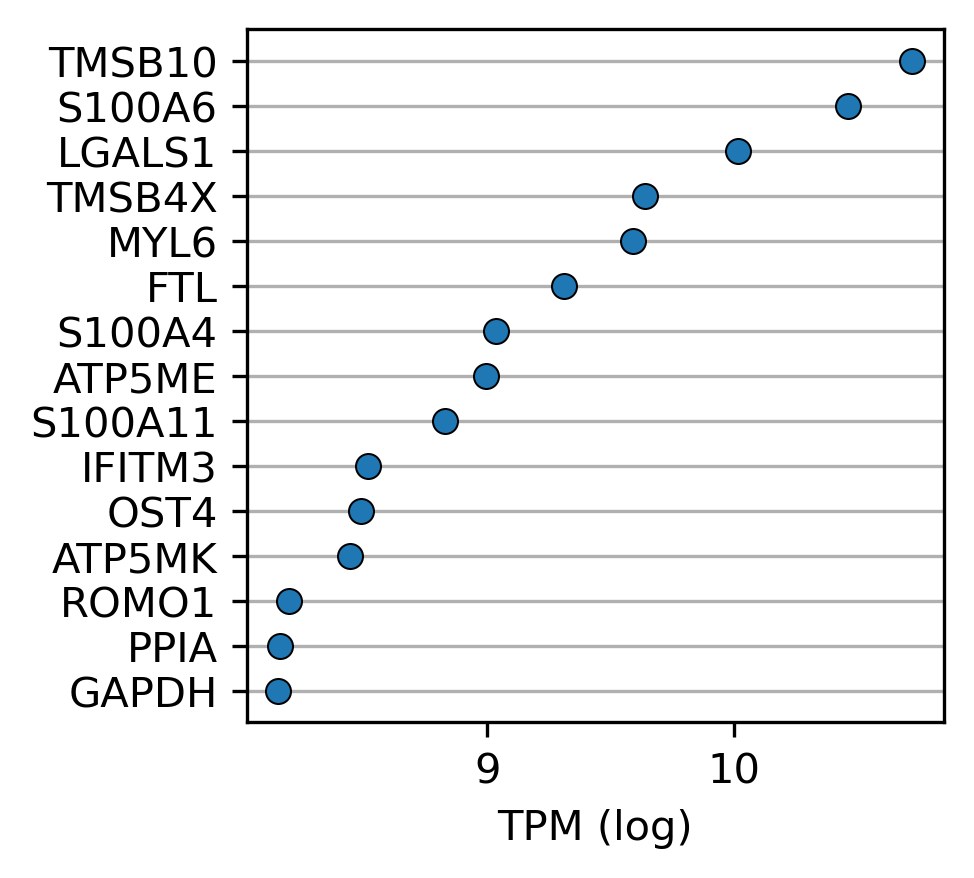

In [7]:
# highly expressed BJ Fib genes
n_genes = 15

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(data=bj.head(n_genes),
                x='log_tpm',
                y='gene_name',
                zorder=3,
                ec='k')

plt.grid(True, axis='y', zorder=0)
plt.ylabel("")
plt.xlabel("TPM (log)")

Text(0.5, 0, 'TPM (log)')

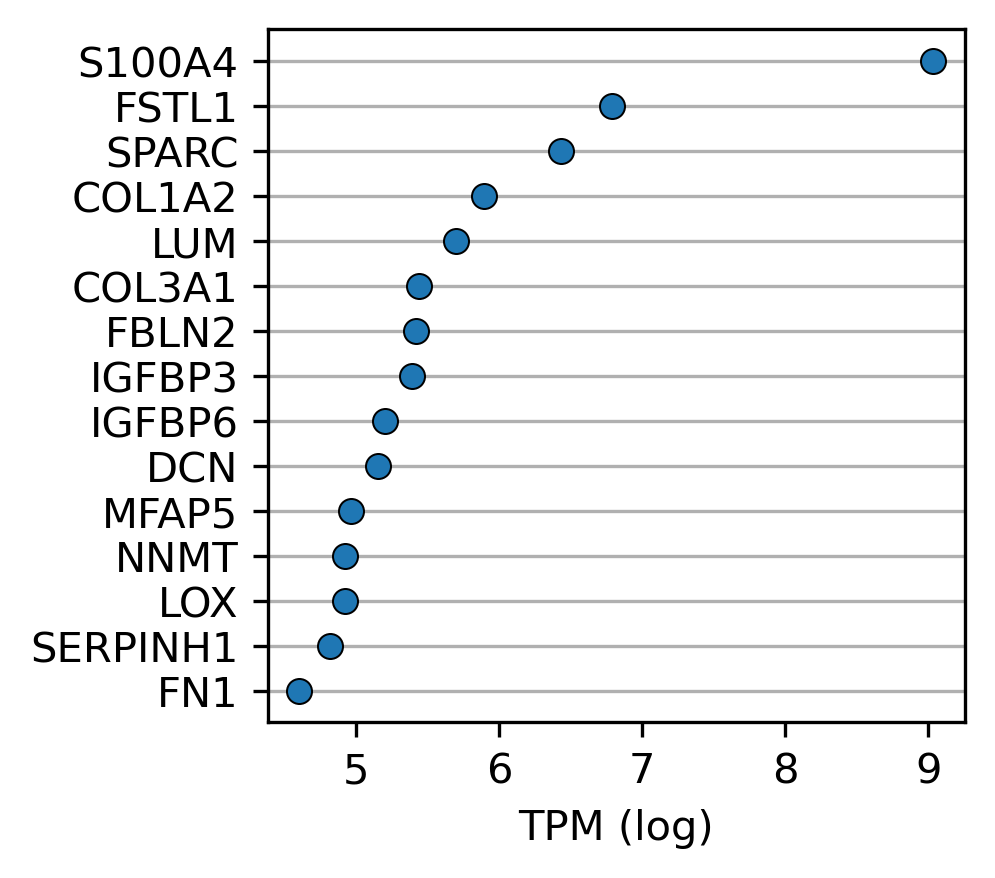

In [8]:
# highly expressed BJ Fib genes that are also panglaoDB fib markers
n_genes = 15

mask = bj['is_panglao_marker']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(data=bj[mask].head(n_genes),
                x='log_tpm',
                y='gene_name',
                zorder=3,
                ec='k')

plt.grid(True, axis='y', zorder=0)
plt.ylabel("")
plt.xlabel("TPM (log)")

Text(0.5, 0, 'TPM (log)')

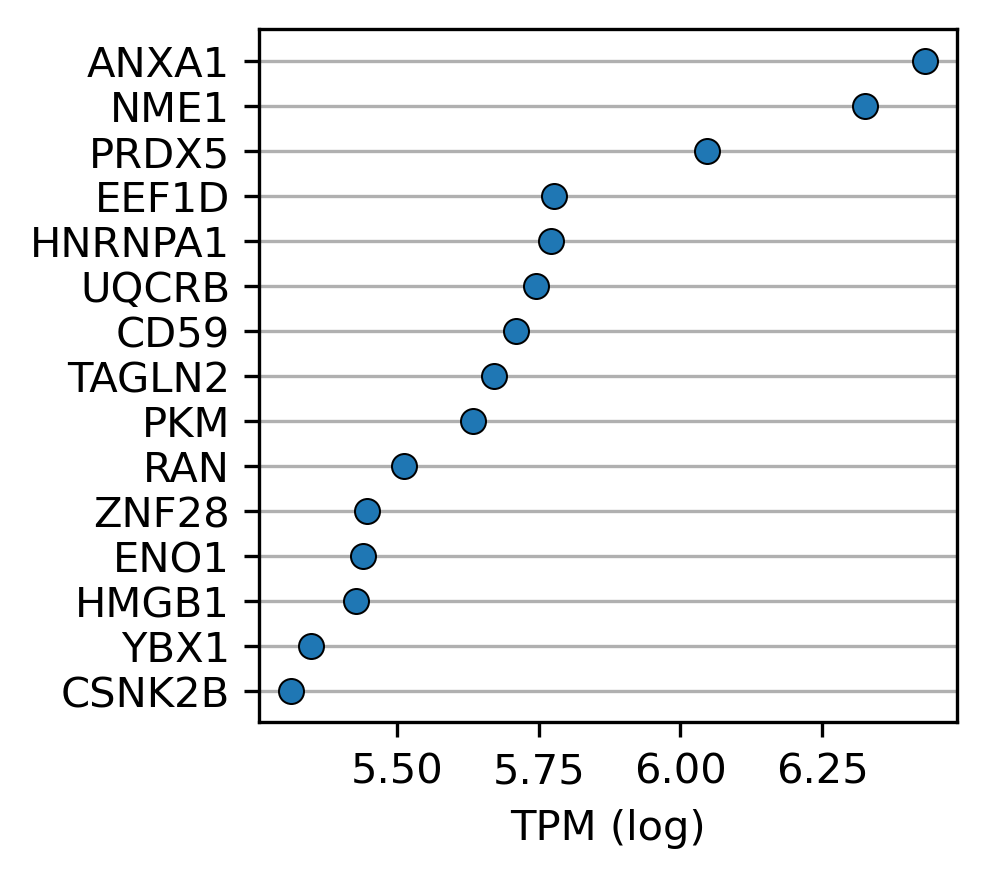

In [9]:
# highly expressed TFs in BJ Fibroblasts
n_genes = 15

tf_list = adata.uns['scenic_transcription_factors']['gene_name'].values
mask = bj['gene_name'].isin(tf_list)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(data=bj[mask].head(n_genes),
                x='log_tpm',
                y='gene_name',
                zorder=3,
                ec='k')

plt.grid(True, axis='y', zorder=0)
plt.ylabel("")
plt.xlabel("TPM (log)")


In [10]:
# a quick enrichment analysis on these genes
n_genes = 20
database = "PanglaoDB_Augmented_2021"

tf_list = adata.uns['scenic_transcription_factors']['gene_name'].values
gene_list = bj[bj['gene_name'].isin(tf_list)].head(n_genes)['gene_name'].values

edf = gget.enrichr(gene_list, database)

columns = [
    'path_name',
    'adj_p_val',
    'overlapping_genes',
]

pd.set_option('display.max_colwidth', None)
edf = edf[columns]
edf.head(5)

Wed May 22 11:44:26 2024 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021.


,path_name,adj_p_val,overlapping_genes
0,Reticulocytes,0.181344,[YBX1]
1,Pluripotent Stem Cells,0.181344,[HNRNPA1]
2,Luminal Epithelial Cells,0.181344,[ANXA1]
3,Basal Cells,0.181344,[CD59]
4,Embryonic Stem Cells,0.181344,[CD59]


# compare BJ expression to our data

In [11]:
# extract the gene expression values
data = adata.to_df()
data.columns = adata.var['gene_name'].values

gene_sum = data.agg(['mean', 'std']).T.reset_index()
gene_sum.columns = ['gene_name', 'log_tpm_mean', "log_tpm_std"]
gene_sum.head()

,gene_name,log_tpm_mean,log_tpm_std
0,ATAD3B,0.059309,0.239482
1,SKI,0.248793,0.467773
2,PEX14,0.043120,0.212347
3,PLCH2,0.030152,0.174196
4,SPSB1,0.000457,0.019186


# Explanation

The average gene expression of our iHSC data is compared to the population BJ expression. Both expression vectors are min-max normalized so that the the log_expression values fall in the [0, 1] range. A simple difference is used to quantify their divergence.


In [12]:
def min_max(v):
    return (v - v.min()) / (v.max() - v.min())

df = pd.merge(bj, gene_sum,
              how='inner',
              left_on='gene_name',
              right_on='gene_name',
             )

print(f"{df.shape=}")

df['population_tpm_normed'] = min_max(df['tpm'])
df['singlecell_tpm_normed'] = min_max(df['log_tpm_mean'])
df['difference'] = df['singlecell_tpm_normed'] - df['population_tpm_normed']

df = df.sort_values(by='difference', ascending=False)

df.head()

df.shape=(14684, 7)


,gene_name,tpm,log_tpm,rank,is_panglao_marker,log_tpm_mean,log_tpm_std,population_tpm_normed,singlecell_tpm_normed,difference
11125,CEACAM3,0.00,0.000000,16321.5,False,5.838604,0.557978,0.000000,1.000000,1.000000
8062,MINDY1,0.38,0.322083,10485.0,False,4.894559,0.612005,0.000008,0.838305,0.838297
4750,PSEN2,2.41,1.226712,6166.0,False,4.822756,0.420332,0.000053,0.826007,0.825954
977,ATG12,36.02,3.611458,1250.0,False,4.775454,0.941779,0.000790,0.817905,0.817115
7090,TMEM168,0.73,0.548121,9183.5,False,4.734786,0.413565,0.000016,0.810939,0.810923


In [13]:
# correlation between iHSC and BJ
r, pval = scipy.stats.pearsonr(df['singlecell_tpm_normed'], df['population_tpm_normed'])
print(f"Correlation Coeff: {r=:.3f} p-value: {pval:.4f}")

Correlation Coeff: r=-0.002 p-value: 0.7809


In [14]:
# genes high in iHSC compared to BJ
n_genes = 50

columns = [
    'gene_name',
    'log_tpm',
    'log_tpm_mean',
    'difference'
]

high_ihsc = df.head(n_genes)
high_ihsc[columns].head(10)

,gene_name,log_tpm,log_tpm_mean,difference
11125,CEACAM3,0.000000,5.838604,1.000000
8062,MINDY1,0.322083,4.894559,0.838297
4750,PSEN2,1.226712,4.822756,0.825954
977,ATG12,3.611458,4.775454,0.817115
7090,TMEM168,0.548121,4.734786,0.810923
3664,ASB1,1.635106,4.522395,0.774470
89,TUBA1A,6.619073,4.582961,0.768520
7484,KLF2,0.457425,4.339087,0.743152
3635,SPTBN1,1.648659,4.269963,0.731233
5417,BPNT2,1.000632,4.222140,0.723096


CEACAM3 ENSG00000170956


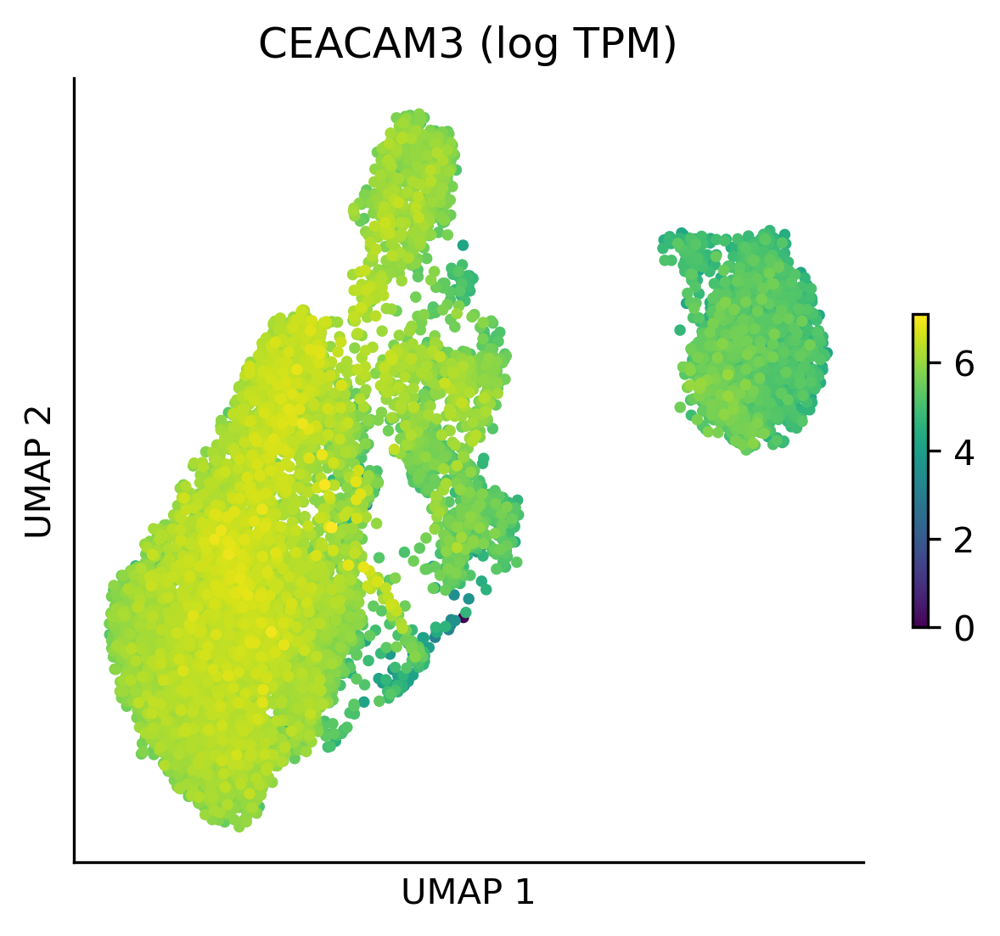

MINDY1 ENSG00000143409


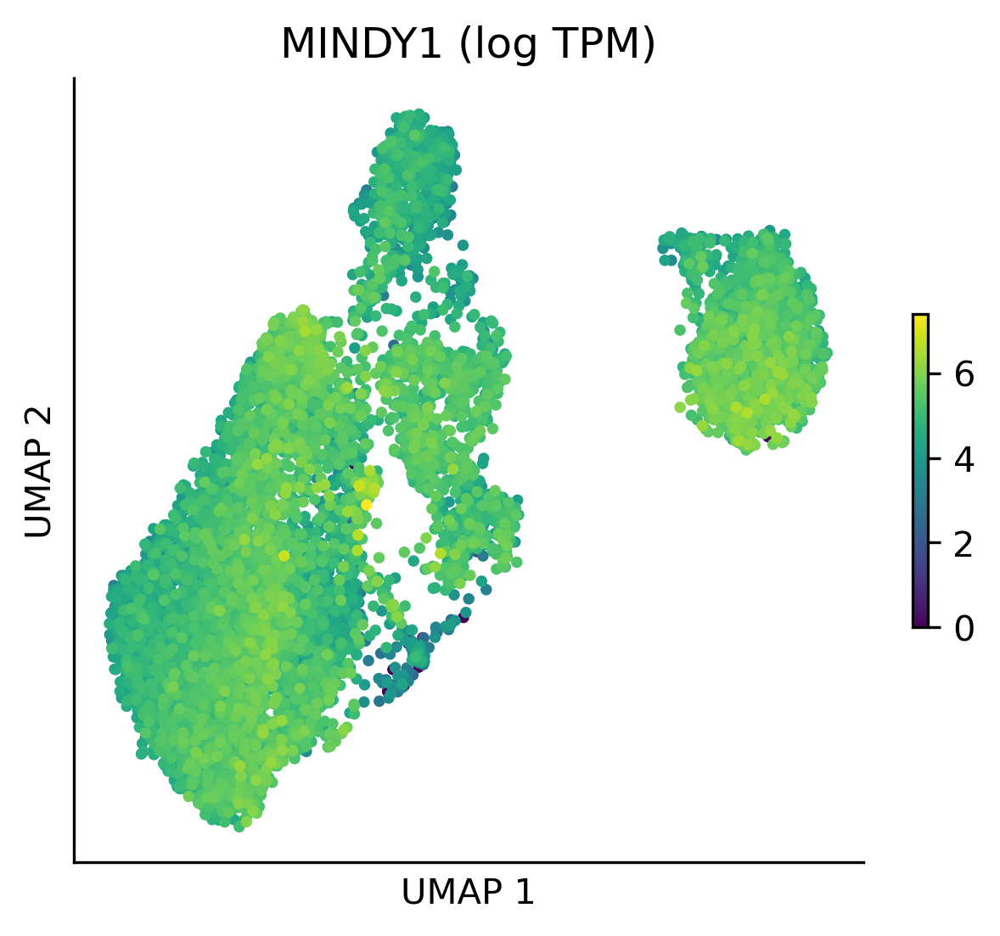

PSEN2 ENSG00000143801


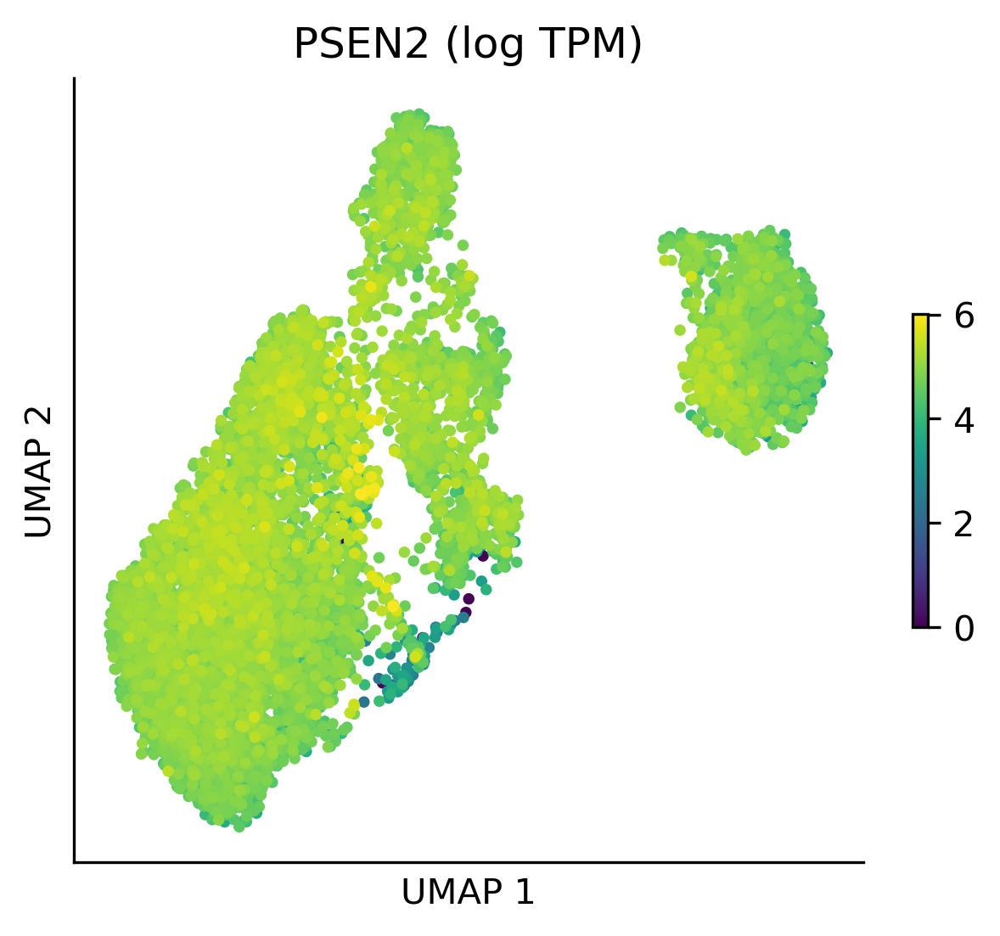

ATG12 ENSG00000145782


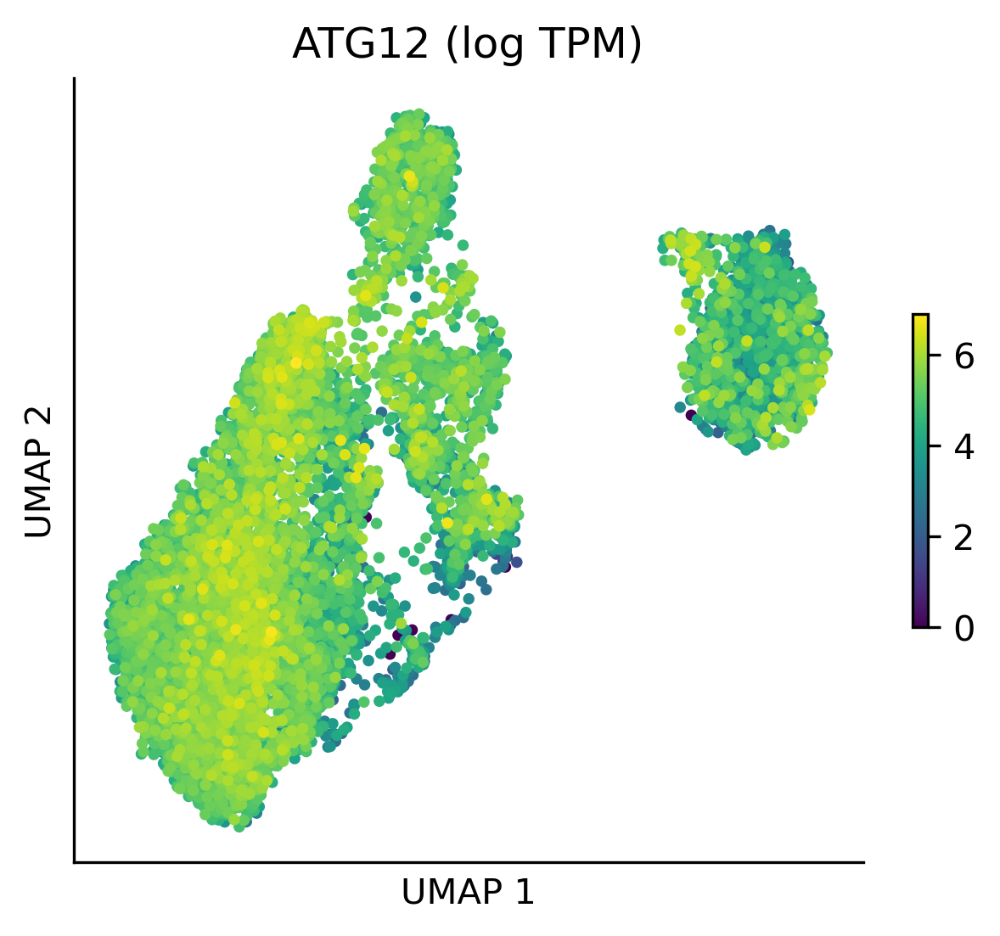

TMEM168 ENSG00000146802


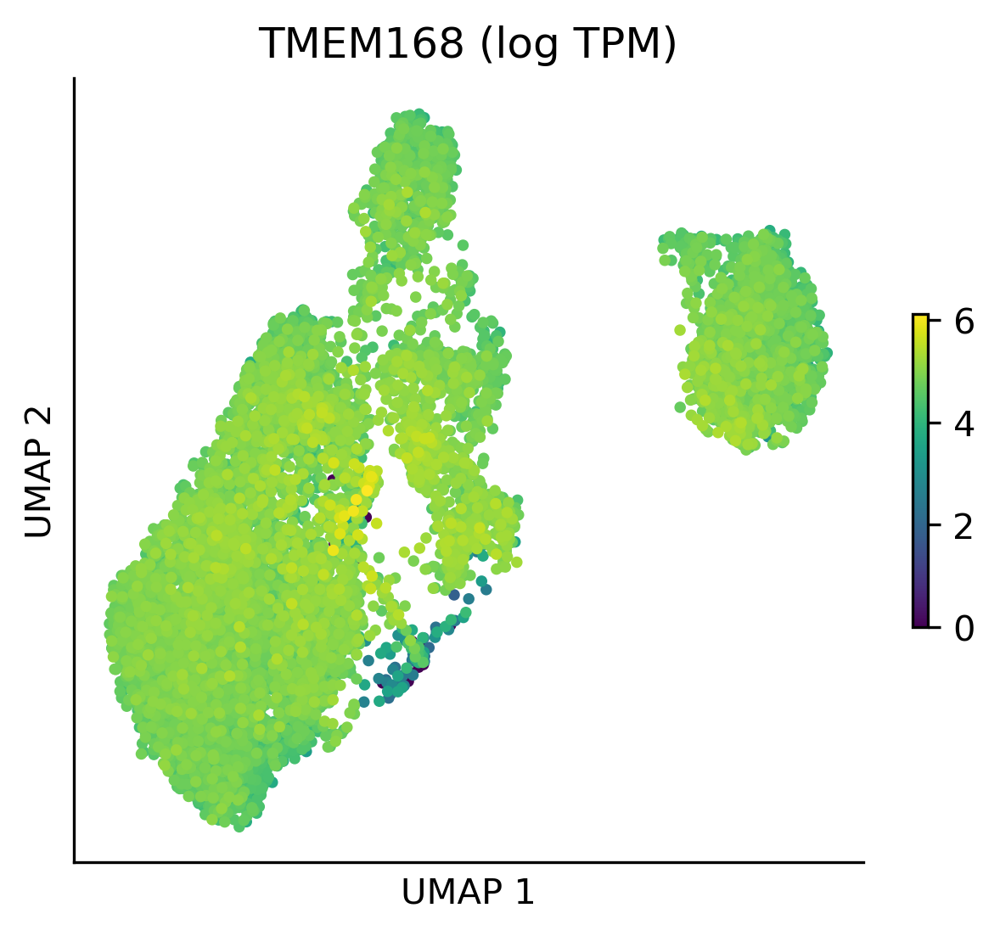

In [15]:
plot_n = 5

for idx, row in high_ihsc.head(plot_n).iterrows():
    gene_name = row['gene_name']
    gene_id = gene_map[gene_name]
    
    print(gene_name, gene_id)

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 5, 4

    plot_umap_scatter(adata, 
                      s=5, 
                      color=gene_id)
    plt.title(f"{gene_name} (log TPM)")
    plt.show()

In [16]:
# a quick enrichment analysis on these genes
database = "PanglaoDB_Augmented_2021"
gene_list = high_ihsc['gene_name'].to_list()

edf = gget.enrichr(gene_list, database)

columns = [
    'path_name',
    'adj_p_val',
    'overlapping_genes',
]

pd.set_option('display.max_colwidth', None)
edf = edf[columns]
edf.head(10)

Wed May 22 11:44:44 2024 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021.


,path_name,adj_p_val,overlapping_genes
0,Megakaryocytes,0.021905,"[CEACAM3, TSPAN9, F13A1, LILRA1]"
1,Taste Receptor Cells,0.073052,"[PCSK2, MOBP, SLC1A2]"
2,Basophils,0.141864,"[CEACAM3, F13A1, LILRA1]"
3,Hepatocytes,0.218314,"[PLSCR1, GLUL, SPTBN1]"
4,Trophoblast Progenitor Cells,0.249882,"[CEACAM3, DTX2]"
5,Satellite Glial Cells,0.249882,"[SLC1A2, GLUL]"
6,Luteal Cells,0.249882,"[PC, TSPAN9]"
7,Tuft Cells,0.249882,"[CEACAM3, LILRA1]"
8,Photoreceptor Cells,0.249882,"[PCSK2, SLC1A2]"
9,Neutrophils,0.249882,"[CEACAM3, LILRA1]"


In [17]:
# look at the genes highest in BJ
n_genes = 50

columns = [
    'gene_name',
    'log_tpm',
    'log_tpm_mean',
    'difference'
]

high_bj = df.tail(n_genes)
high_bj[columns].head(10)


,gene_name,log_tpm,log_tpm_mean,difference
69,CSTB,6.817951,0.007249,-0.018820
73,NACA,6.788645,0.002402,-0.019071
70,S100A10,6.817721,0.004699,-0.019252
24,NDUFB2,7.654050,0.144893,-0.021461
67,MYL12B,6.901103,0.001626,-0.021522
55,IFITM2,7.122116,0.029999,-0.022052
62,ATP5MG,6.957897,0.002195,-0.022698
29,NDUFA11,7.601227,0.120710,-0.023222
56,PHPT1,7.090385,0.011475,-0.024376
48,NDUFA3,7.267623,0.032487,-0.025883


CSTB ENSG00000160213


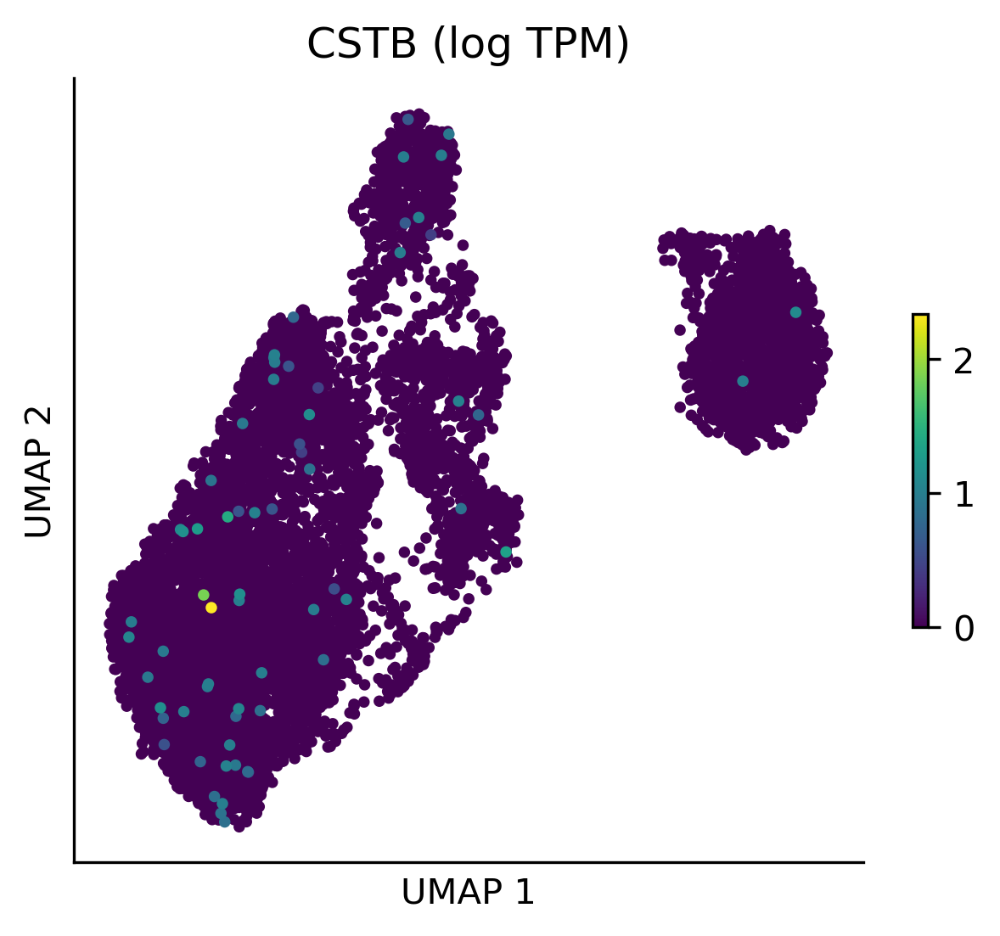

NACA ENSG00000196531


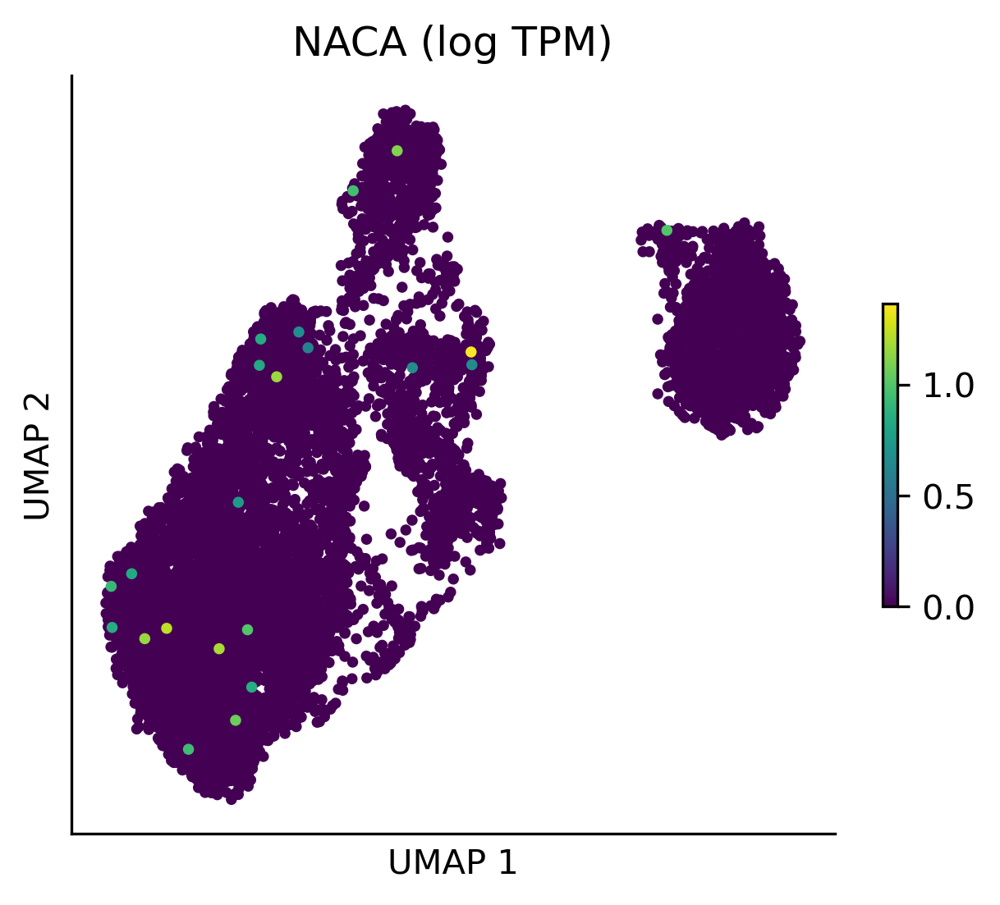

S100A10 ENSG00000197747


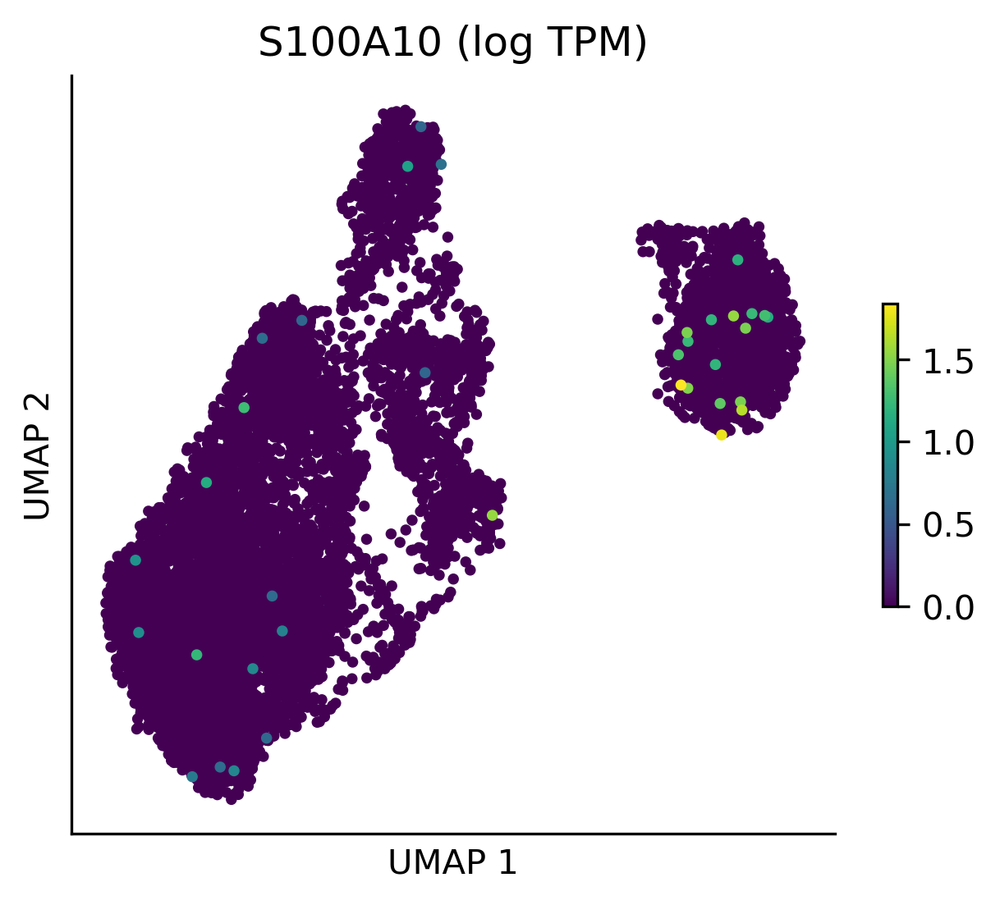

NDUFB2 ENSG00000090266


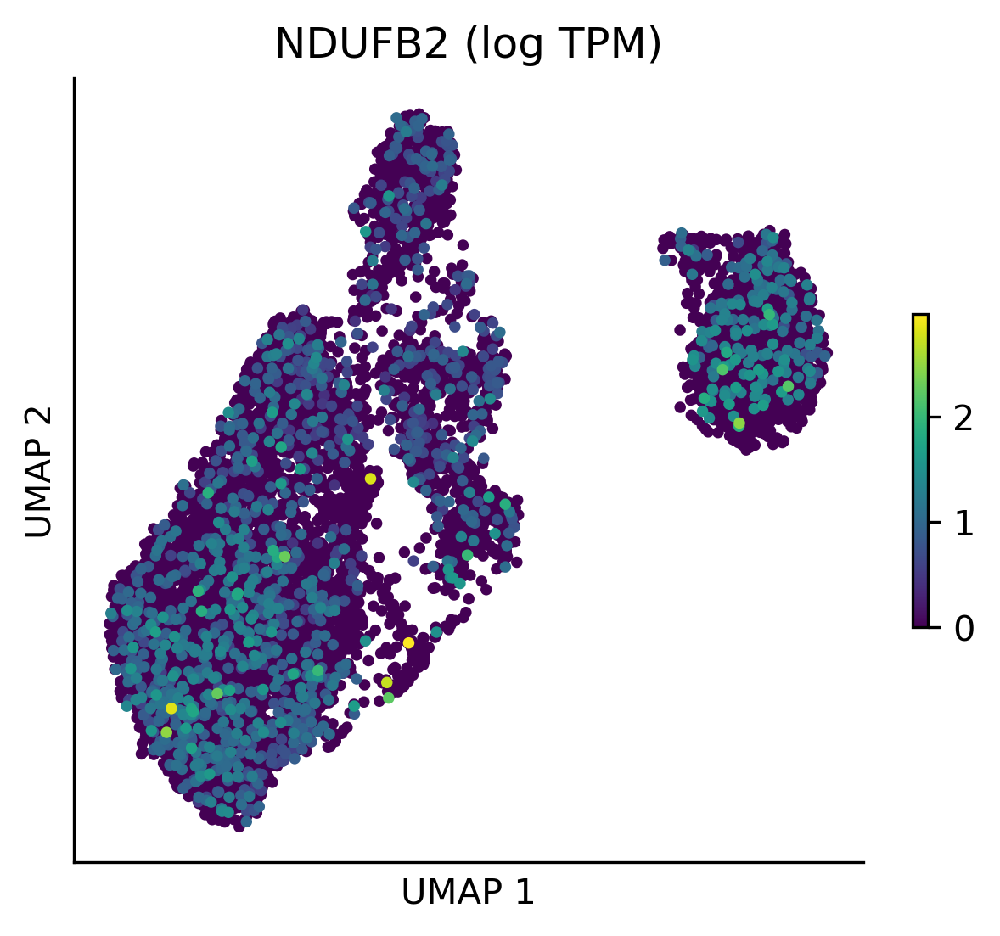

MYL12B ENSG00000118680


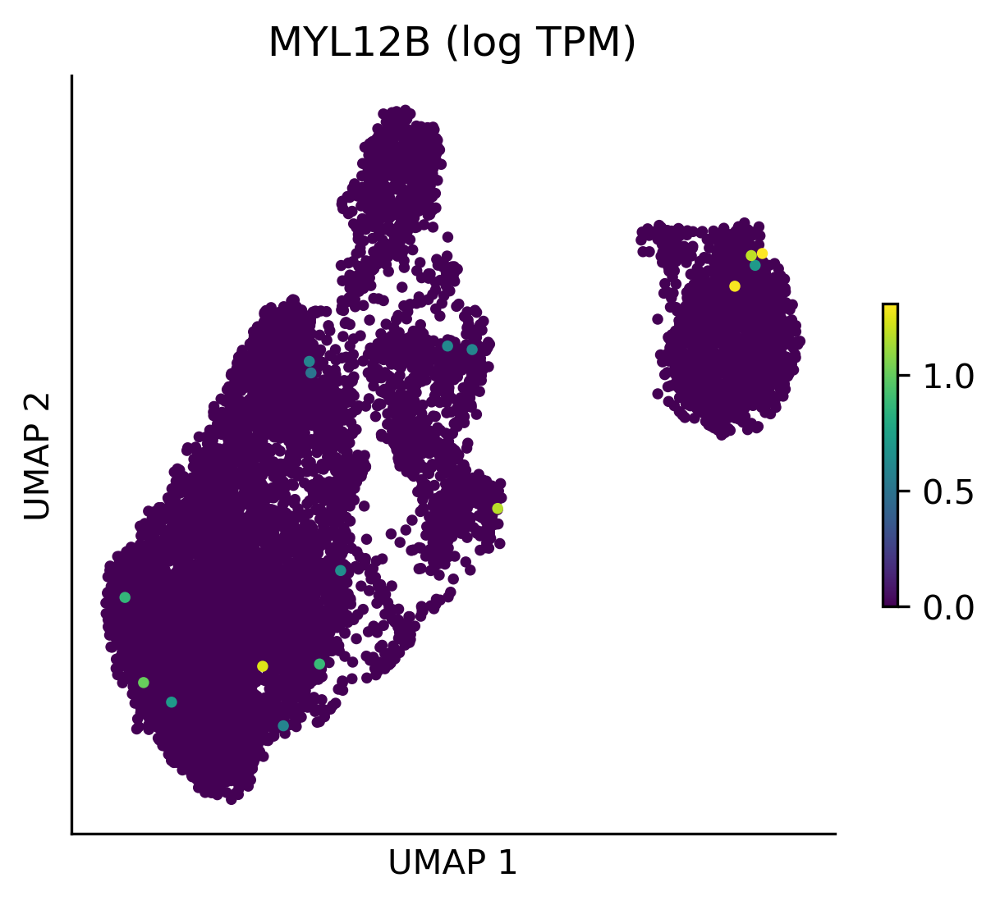

In [18]:
plot_n = 5

for idx, row in high_bj.head(plot_n).iterrows():
    gene_name = row['gene_name']
    gene_id = gene_map[gene_name]
    
    print(gene_name, gene_id)

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 5, 4

    plot_umap_scatter(adata, 
                      s=5, 
                      color=gene_id)
    plt.title(f"{gene_name} (log TPM)")
    plt.show()

In [19]:
# a quick enrichment analysis on these genes
database = "PanglaoDB_Augmented_2021"
gene_list = high_bj['gene_name'].to_list()

edf = gget.enrichr(gene_list, database)

columns = [
    'path_name',
    'adj_p_val',
    'overlapping_genes',
]

pd.set_option('display.max_colwidth', None)
edf = edf[columns]
edf.head(10)

Wed May 22 11:44:46 2024 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021.


,path_name,adj_p_val,overlapping_genes
0,Trophoblast Cells,0.126261,"[ANXA2, S100A11, S100A10]"
1,Basal Cells,0.384567,"[ANXA2, S100A11]"
2,Mesangial Cells,0.384567,"[CSTB, TPM2]"
3,Monocytes,0.384567,"[IFITM3, S100A4]"
4,Endothelial Cells,0.384567,"[S100A13, S100A10]"
5,Airway Smooth Muscle Cells,0.384567,[TPM2]
6,Myofibroblasts,0.384567,[TPM2]
7,Ciliated Cells,0.384567,[ATP5MK]
8,Undefined Placental Cells,0.384567,[NME2]
9,Granulosa Cells,0.384567,[GAPDH]


# Compute the Distance Between Our Cells and BJ

data.shape=(8562, 14684) bj_expression.shape=(1, 14684)


Text(0.5, 0, 'Normed Distance to BJ')

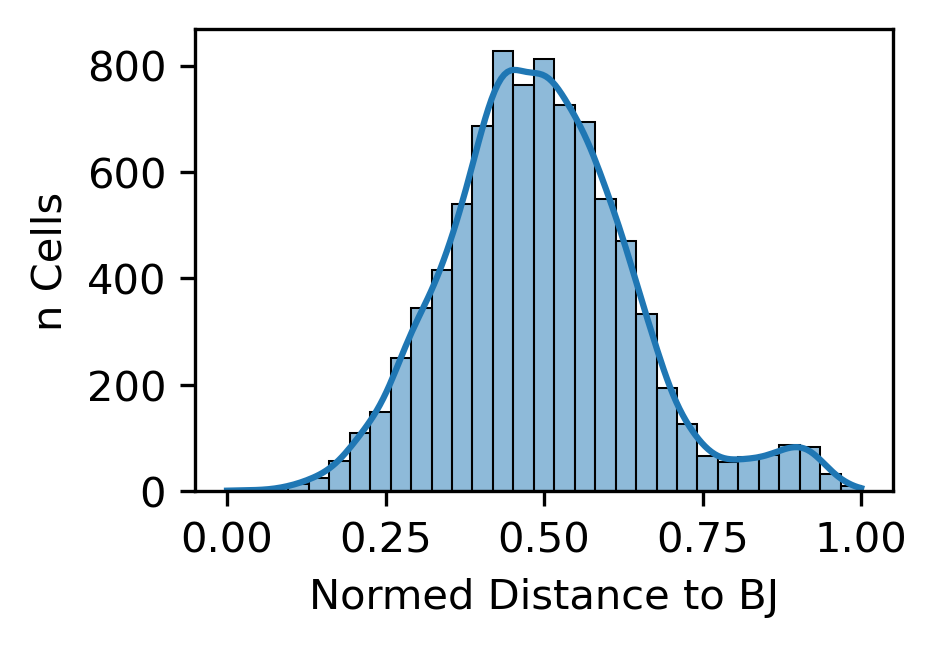

In [20]:
data = adata.to_df()
data.columns = adata.var['gene_name'].values

shared_genes = np.intersect1d(data.columns, bj['gene_name'].values)
data = data[shared_genes]

bj_expression  = bj[bj['gene_name'].isin(shared_genes)]
bj_expression = bj_expression.sort_values(by='gene_name')
bj_expression = bj_expression['log_tpm']
bj_expression = bj_expression.to_numpy().reshape(1, -1)

print(f"{data.shape=} {bj_expression.shape=}")

distance = min_max(np.ravel(scipy.spatial.distance.cdist(data, bj_expression)))
adata.obs['distance_to_bj'] = distance

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 2

sns.histplot(x=distance, bins=31, kde=True)
plt.ylabel("n Cells")
plt.xlabel("Normed Distance to BJ")


Text(0.5, 1.0, 'Normed Distance to BJ')

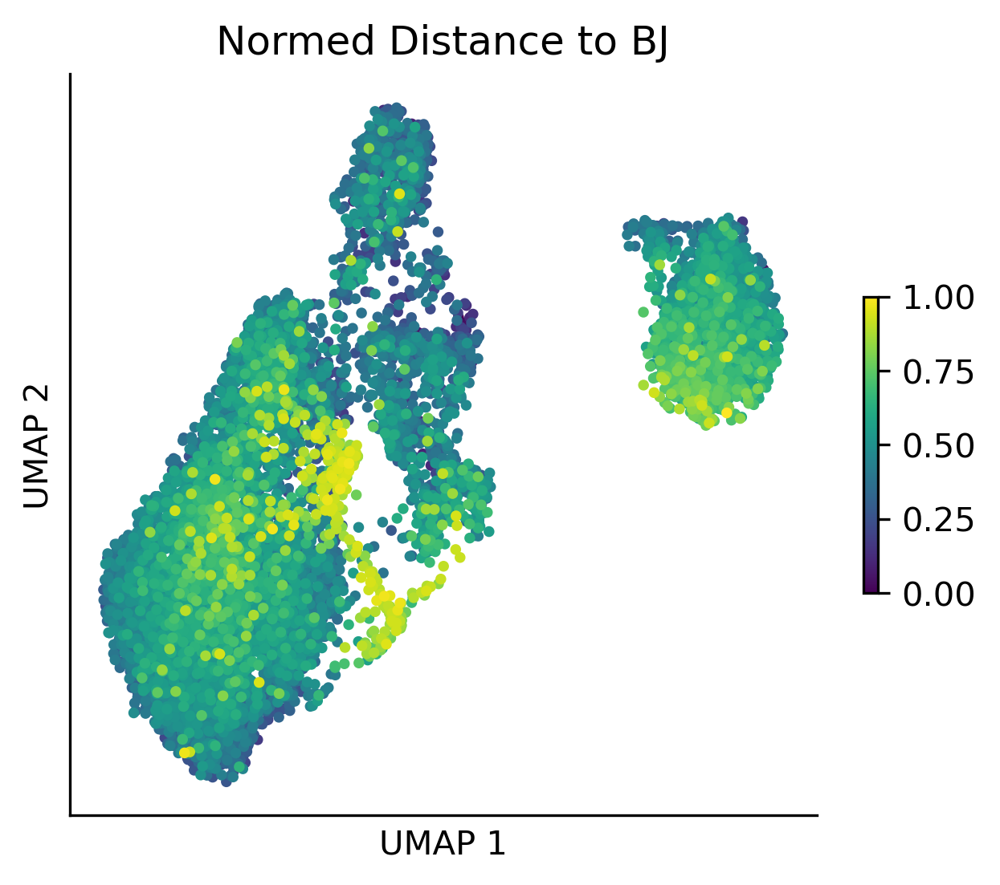

In [21]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  color='distance_to_bj')

plt.title(f"Normed Distance to BJ")

# Gene Set Scoring

We compute the enrichment of a set of genes relative to the same number of randomly sampled genes in the iHSC data.

Text(0.5, 1.0, 'panglaodb : Fibroblasts')

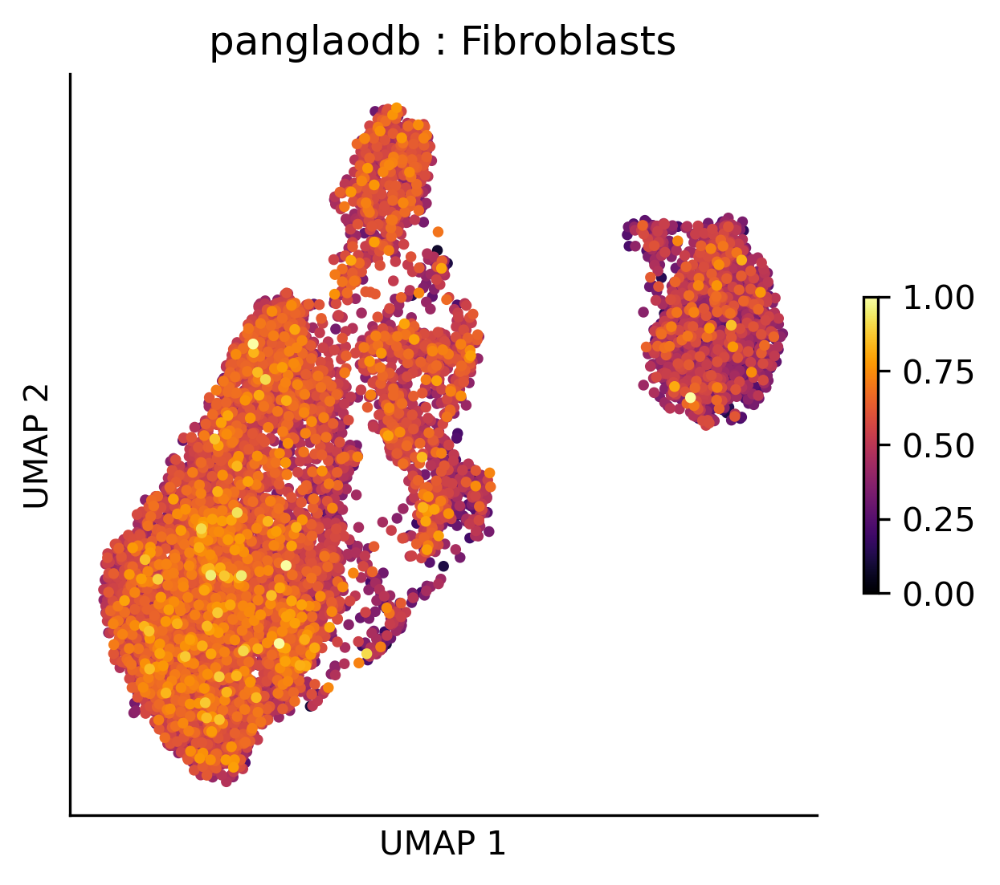

In [22]:
db = 'panglaodb'
column = 'cell_type'
value = 'Fibroblasts'
genes = adata.uns[db][adata.uns[db][column] == value]['gene_name'].values
gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

sc.tl.score_genes(adata,
                  gene_list=gene_ids, 
                  ctrl_size=len(gene_ids),
                  score_name=value)

adata.obs[value] = min_max(adata.obs[value])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=value)

plt.title(f"{db} : {value}")

Text(0.5, 1.0, 'panglaodb : Hematopoietic stem cells')

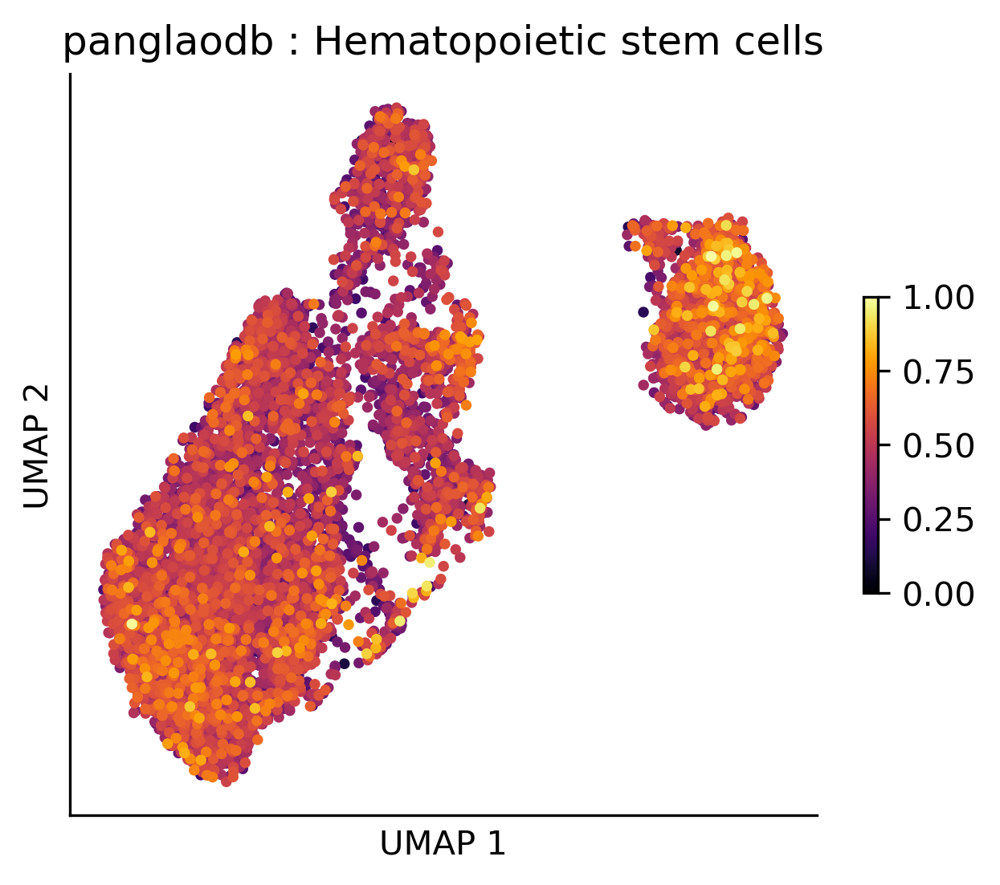

In [23]:
db = 'panglaodb'
column = 'cell_type'
value = 'Hematopoietic stem cells'
genes = adata.uns[db][adata.uns[db][column] == value]['gene_name'].values
gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

sc.tl.score_genes(adata,
                  gene_list=gene_ids, 
                  ctrl_size=len(gene_ids),
                  score_name=value)

adata.obs[value] = min_max(adata.obs[value])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=value)

plt.title(f"{db} : {value}")

Text(0.5, 1.0, 'bj_genes')

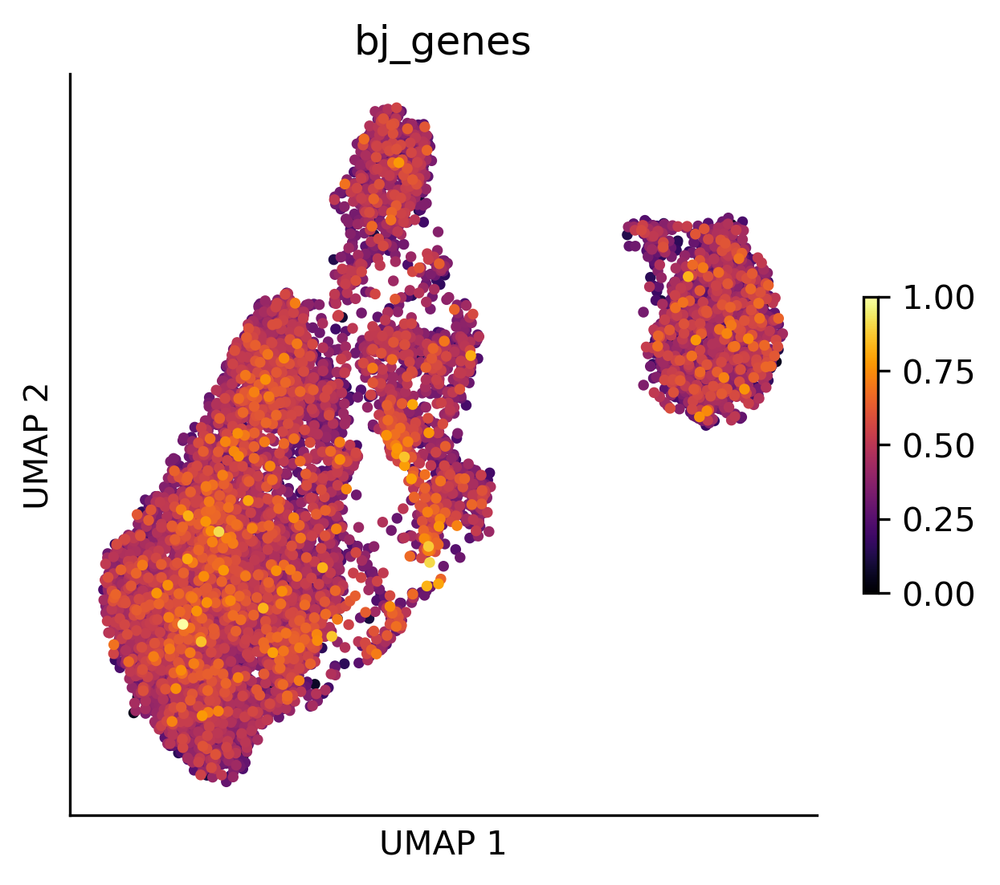

In [24]:
# the top most expressed BJ genes

n_genes = 100

value = "bj_genes"

genes = bj.head(n_genes)['gene_name'].to_list()
gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

sc.tl.score_genes(adata,
                  gene_list=gene_ids, 
                  ctrl_size=len(gene_ids),
                  score_name=value)

adata.obs[value] = min_max(adata.obs[value])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=value)

plt.title(f"{value}")

BJ gene set has a lower score than HSC gene set with p-value=0.0000


Text(0.5, 0, '')

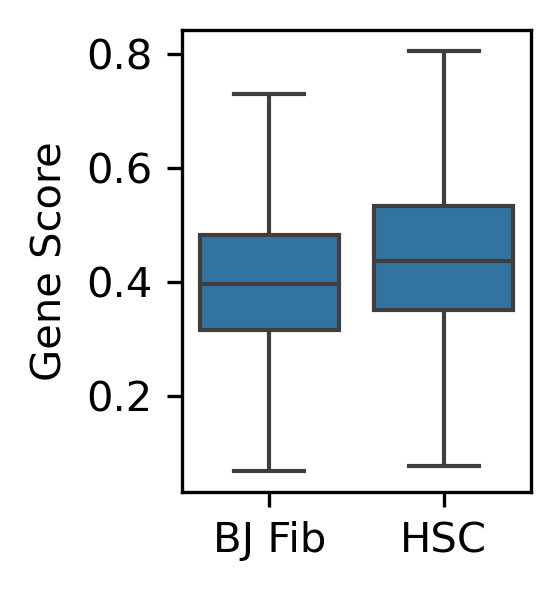

In [25]:
plot_df = adata.obs.copy().reset_index()

t, pval = scipy.stats.ranksums(plot_df['bj_genes'], 
                               plot_df['Hematopoietic stem cells'], 
                               alternative='less')

print(f"BJ gene set has a lower score than HSC gene set with p-value={pval:.4f}")

plot_df = pd.melt(plot_df, 
                  id_vars='cell_id', 
                  value_vars=['bj_genes',
                              'Hematopoietic stem cells'])

type_map = {
    "Hematopoietic stem cells" : "HSC",
    "bj_genes" : "BJ Fib" ,
}

plot_df['variable'] = plot_df['variable'].map(type_map)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 1.5, 2
sns.boxplot(data=plot_df, 
             x='variable',
             showfliers=False,
             y='value')

plt.ylabel('Gene Score')
plt.xlabel('')

# compairison to Tabula Sapiens DEG profiles

Text(0.5, 1.0, 'tabula_sapiens_deg : fibroblast')

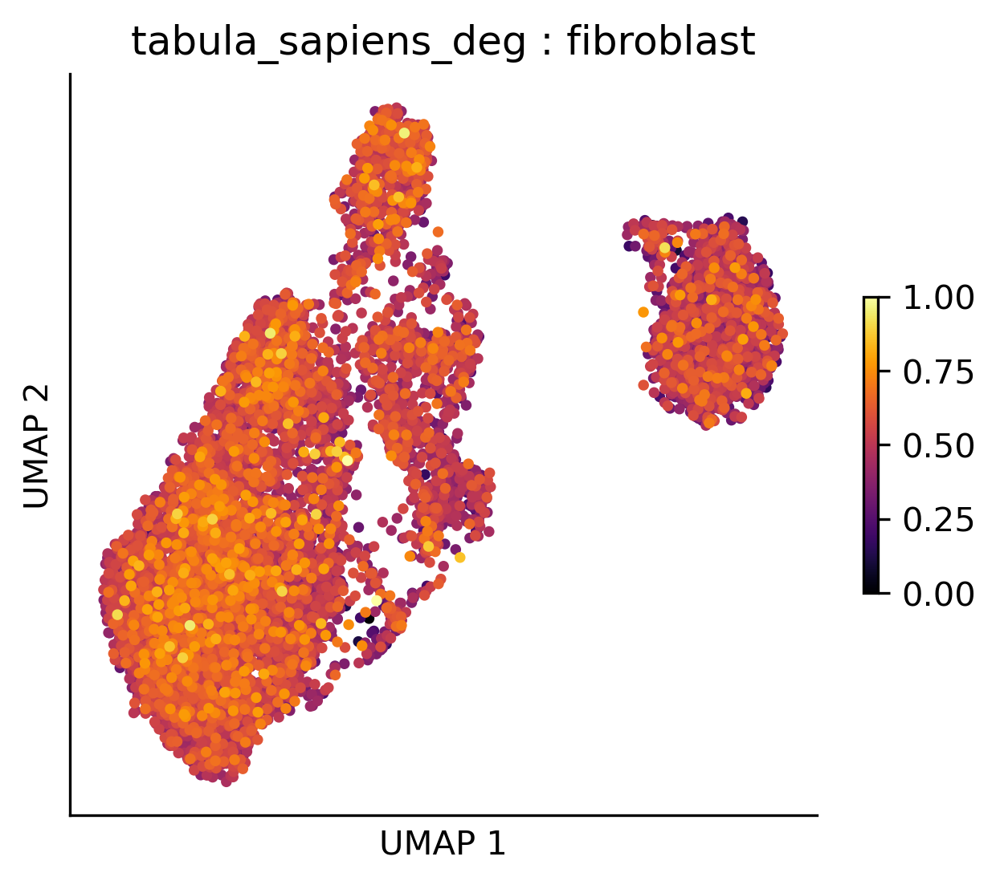

In [26]:
# the top most expressed BJ genes
n_genes = 100
db = 'tabula_sapiens_deg'
column = 'cell_type'
value = 'fibroblast'
data = adata.uns[db][adata.uns[db][column] == value]
data = data.sort_values(by='logfoldchanges', ascending=False)
data = data[~data['gene_name'].str.startswith("MT")]
data = data[~data['gene_name'].str.startswith("RP")]
genes = data.head(n_genes)['gene_name'].values
gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

sc.tl.score_genes(adata,
                  gene_list=gene_ids, 
                  ctrl_size=len(gene_ids),
                  score_name=value)

adata.obs[value] = min_max(adata.obs[value])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=value)

plt.title(f"{db} : {value}")

Text(0.5, 1.0, 'tabula_sapiens_deg : hematopoietic stem cell')

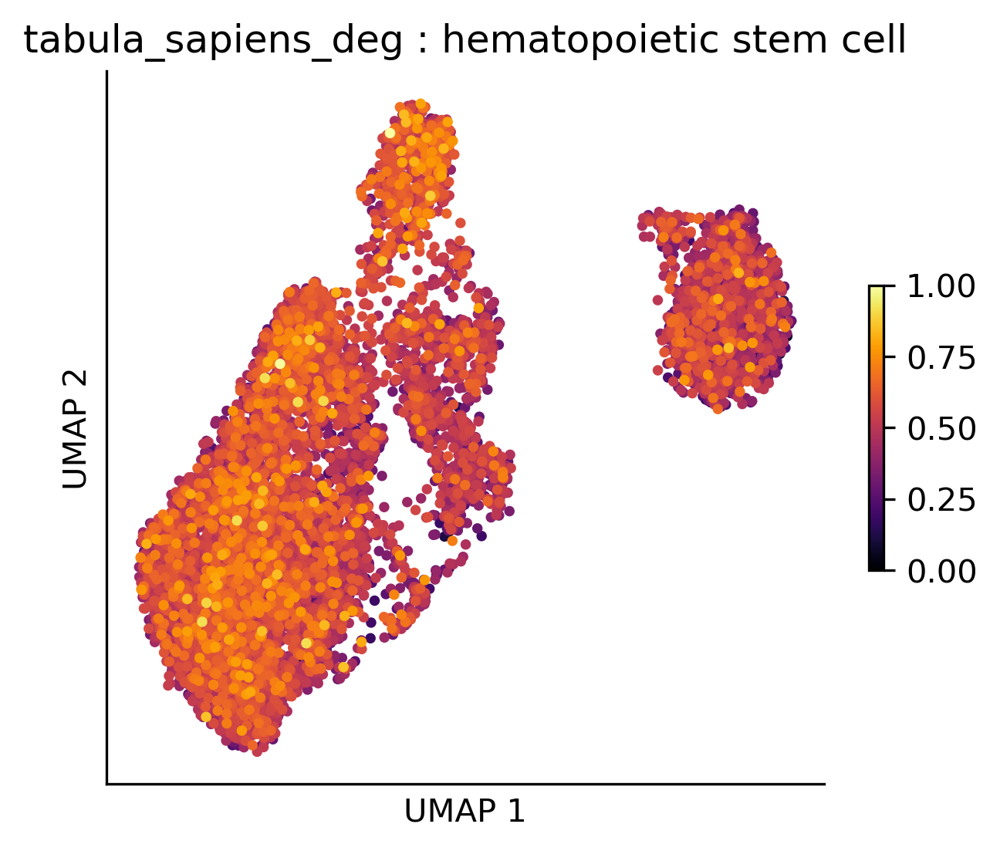

In [27]:
# the top most expressed BJ genes
n_genes = 100
db = 'tabula_sapiens_deg'
column = 'cell_type'
value = 'hematopoietic stem cell'
data = adata.uns[db][adata.uns[db][column] == value]
data = data.sort_values(by='logfoldchanges', ascending=False)

data = data[~data['gene_name'].str.startswith("MT")]
data = data[~data['gene_name'].str.startswith("RP")]

genes = data.head(n_genes)['gene_name'].values
gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

sc.tl.score_genes(adata,
                  gene_list=gene_ids, 
                  ctrl_size=len(gene_ids),
                  score_name=value)

adata.obs[value] = min_max(adata.obs[value])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=value)

plt.title(f"{db} : {value}")

FB gene set has a lower score than HSC gene set with p-value=0.9999


Text(0.5, 0, '')

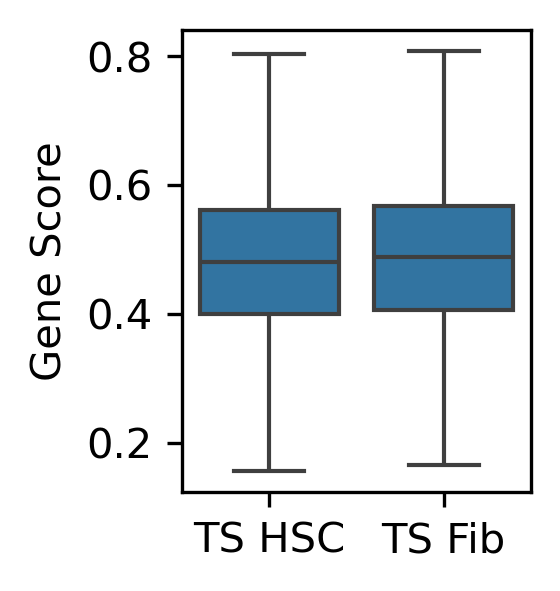

In [28]:
plot_df = adata.obs.copy().reset_index()

t, pval = scipy.stats.ranksums(plot_df['fibroblast'], 
                               plot_df['hematopoietic stem cell'], 
                               alternative='less')

print(f"FB gene set has a lower score than HSC gene set with p-value={pval:.4f}")

plot_df = pd.melt(plot_df, 
                  id_vars='cell_id', 
                  value_vars=['hematopoietic stem cell',
                              'fibroblast'])

type_map = {
    "hematopoietic stem cell" : "TS HSC",
    "fibroblast" : "TS Fib" ,
}

plot_df['variable'] = plot_df['variable'].map(type_map)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 1.5, 2
sns.boxplot(data=plot_df, 
             x='variable',
             showfliers=False,
             y='value')

plt.ylabel('Gene Score')
plt.xlabel('')

# DGC DEG Profiles

Text(0.5, 1.0, 'log2fc_fb_v_hsc')

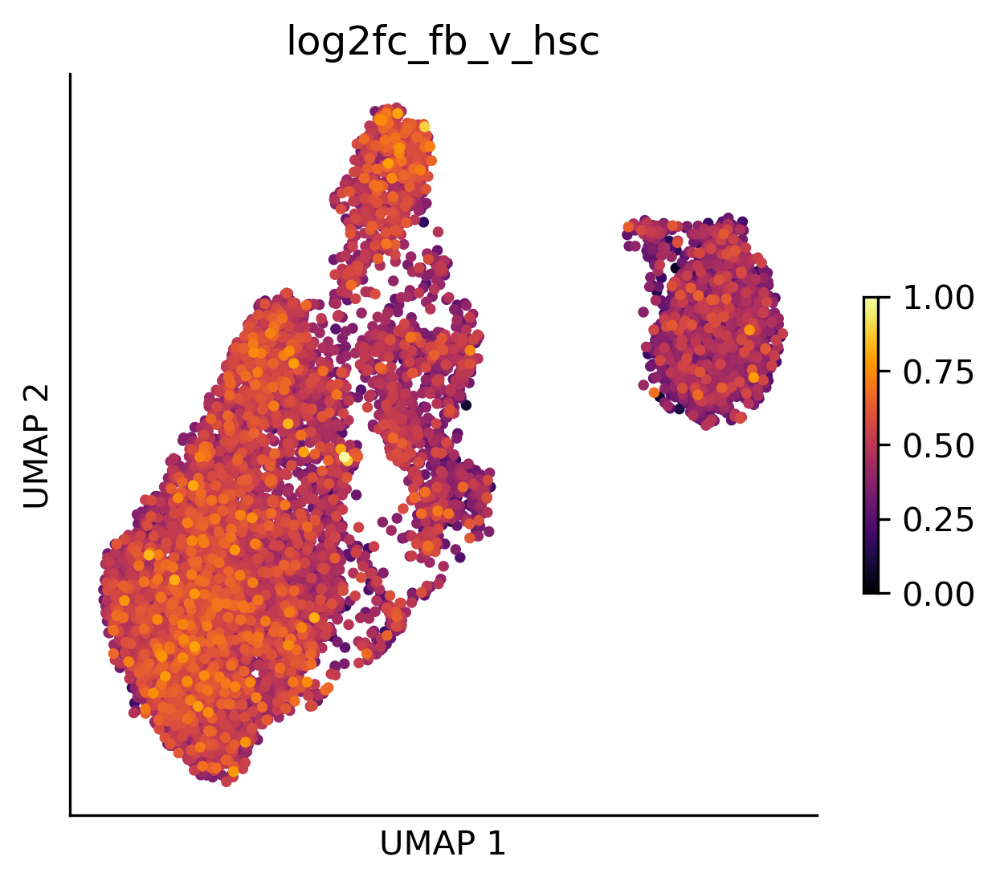

In [29]:
# the top most expressed BJ genes
n_genes = 100
db = 'fb_vs_hsc_up'
column = 'log2fc_fb_v_hsc'
data = adata.uns[db]
data = data.sort_values(by=column, ascending=False)
data = data[~data['gene_name'].str.startswith("MT")]
data = data[~data['gene_name'].str.startswith("RP")]
genes = data.head(n_genes)['gene_name'].values
gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

sc.tl.score_genes(adata,
                  gene_list=gene_ids, 
                  ctrl_size=len(gene_ids),
                  score_name=column)

adata.obs[column] = min_max(adata.obs[column])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column)

plt.title(f"{column}")

Text(0.5, 1.0, 'log2fc_hsc_v_fb')

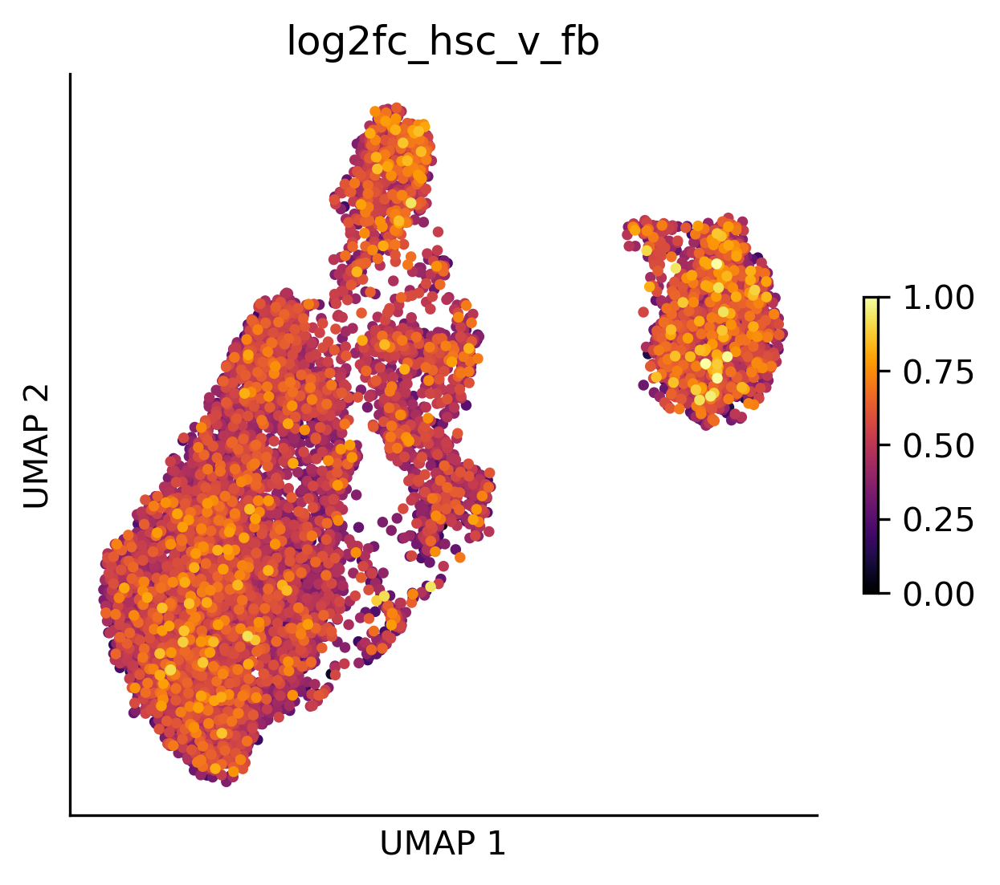

In [30]:
# the top most expressed BJ genes
n_genes = 100
db = 'hsc_v_fib_up'
column = 'log2fc_hsc_v_fb'
data = adata.uns[db]
data = data.sort_values(by=column, ascending=False)
data = data[~data['gene_name'].str.startswith("MT")]
data = data[~data['gene_name'].str.startswith("RP")]
genes = data.head(n_genes)['gene_name'].values
gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

sc.tl.score_genes(adata,
                  gene_list=gene_ids, 
                  ctrl_size=len(gene_ids),
                  score_name=column)

adata.obs[column] = min_max(adata.obs[column])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column)

plt.title(f"{column}")

FB gene set has a lower score than HSC gene set with p-value=0.0000


Text(0.5, 0, '')

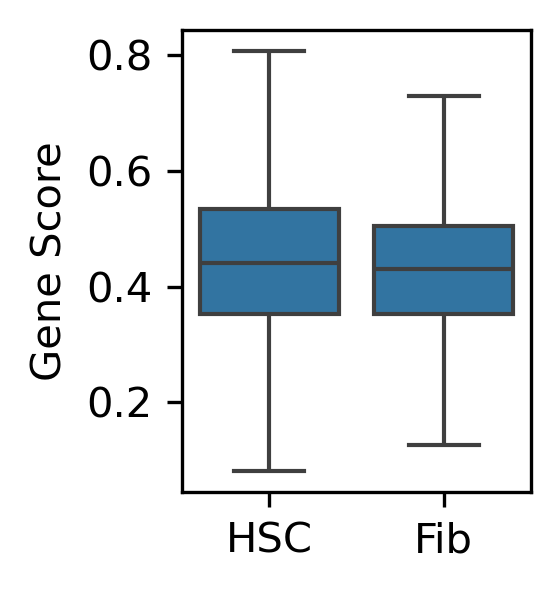

In [31]:
plot_df = adata.obs.copy().reset_index()

t, pval = scipy.stats.ranksums(plot_df['log2fc_fb_v_hsc'], 
                               plot_df['log2fc_hsc_v_fb'], 
                               alternative='less')

print(f"FB gene set has a lower score than HSC gene set with p-value={pval:.4f}")

plot_df = pd.melt(plot_df, 
                  id_vars='cell_id', 
                  value_vars=['log2fc_hsc_v_fb',
                              'log2fc_fb_v_hsc'])

type_map = {
    "log2fc_hsc_v_fb" : "HSC",
    "log2fc_fb_v_hsc" : "Fib" ,
}

plot_df['variable'] = plot_df['variable'].map(type_map)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 1.5, 2
sns.boxplot(data=plot_df, 
             x='variable',
             showfliers=False,
             y='value')

plt.ylabel('Gene Score')
plt.xlabel('')

# HSC Transcriptional Program

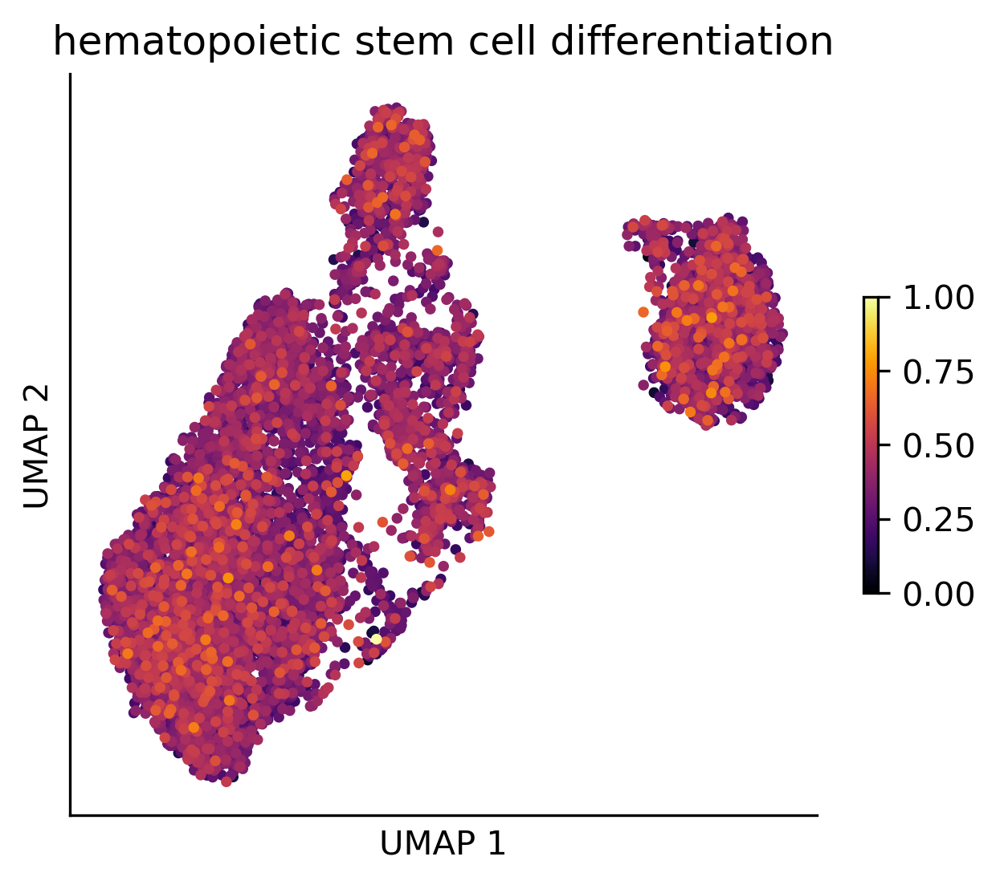

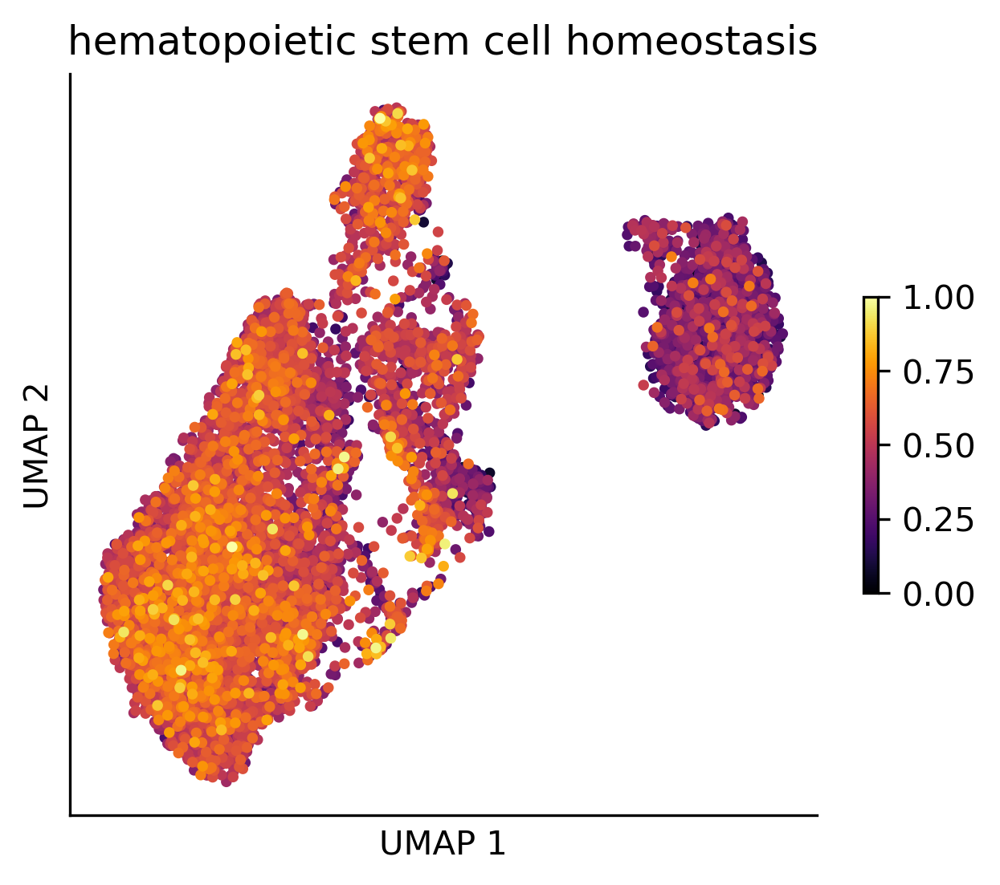

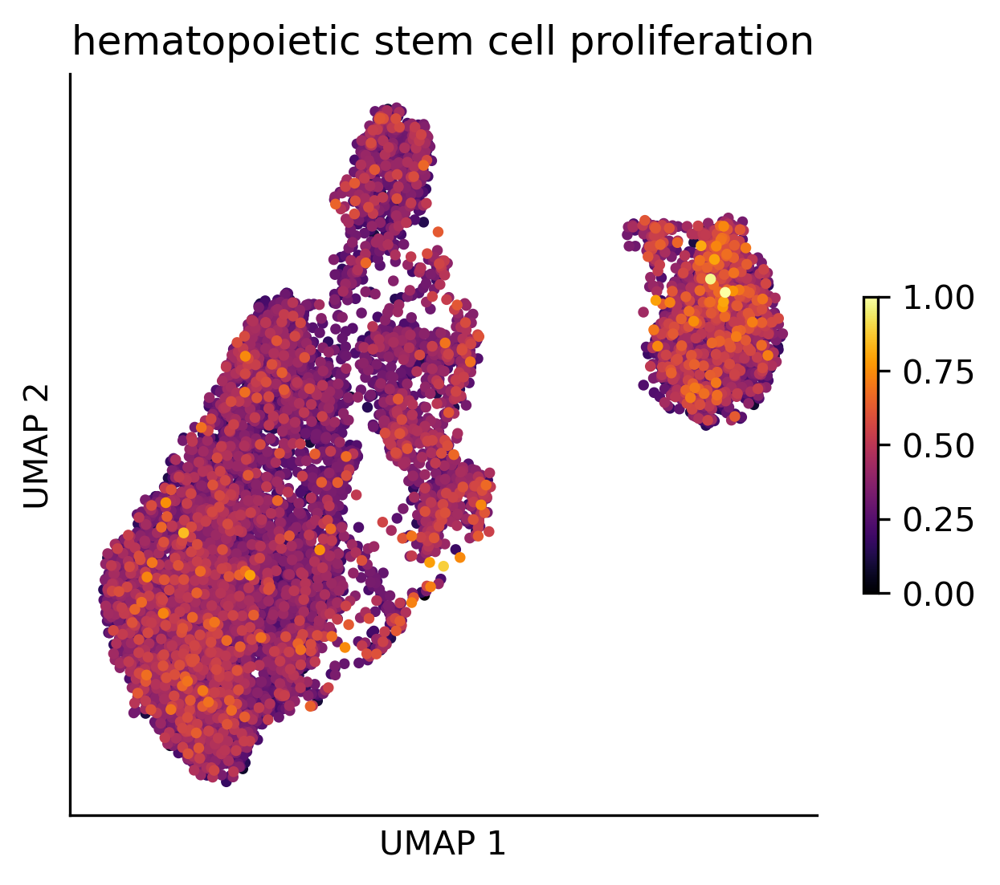

In [32]:
go = adata.uns['go_annotations']

for process, group in go.groupby('go_biological_process'):
    
    genes = group['gene_name'].to_list()
    gene_ids = adata.var[adata.var['gene_name'].isin(genes)].index

    sc.tl.score_genes(adata,
                      gene_list=gene_ids, 
                      ctrl_size=len(gene_ids),
                      score_name=process)

    adata.obs[process] = min_max(adata.obs[process])

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 5, 4

    plot_umap_scatter(adata, 
                      vmin=0,
                      vmax=1,
                      s=5, 
                      cmap='inferno',
                      color=process)

    plt.title(f"{process}")
    plt.show()

# HSC Gene Expression Profiles

In [33]:
def calculate_gene_expression_stats(df):
    """
    Calculates aggregate gene expression statistics for a given DataFrame.

    Args:
        df (pd.DataFrame): A DataFrame with cells as rows and genes as columns.

    Returns:
        pd.DataFrame: A DataFrame with one row per gene, containing aggregated statistics.
    """

    # Aggregate statistics
    stats = pd.DataFrame({
        'average_expression': df.mean(),
        'median_expression': df.median(),
        'std_dev': df.std(ddof=0),  # Sample standard deviation
        'num_nonzero_cells': (df > 0).sum(),
        'percent_nonzero': 100 * (df != 0).mean()
    })

    # Round percent_nonzero to 2 decimal places
    stats['percent_nonzero'] = stats['percent_nonzero'].round(2)
    stats = stats.sort_values(by='average_expression', ascending=False)

    return stats

,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
CD34,0.312173,0.0,0.530812,2457,28.70
PTPRC,0.247936,0.0,0.469511,2058,24.04
CD164,0.242190,0.0,0.464634,2029,23.70
GATA2,0.175568,0.0,0.404673,1502,17.54
GFI1B,0.095173,0.0,0.301088,851,9.94
FOS,0.064525,0.0,0.253096,583,6.81
REL,0.046848,0.0,0.210961,451,5.27
STAT5A,0.044702,0.0,0.211279,406,4.74


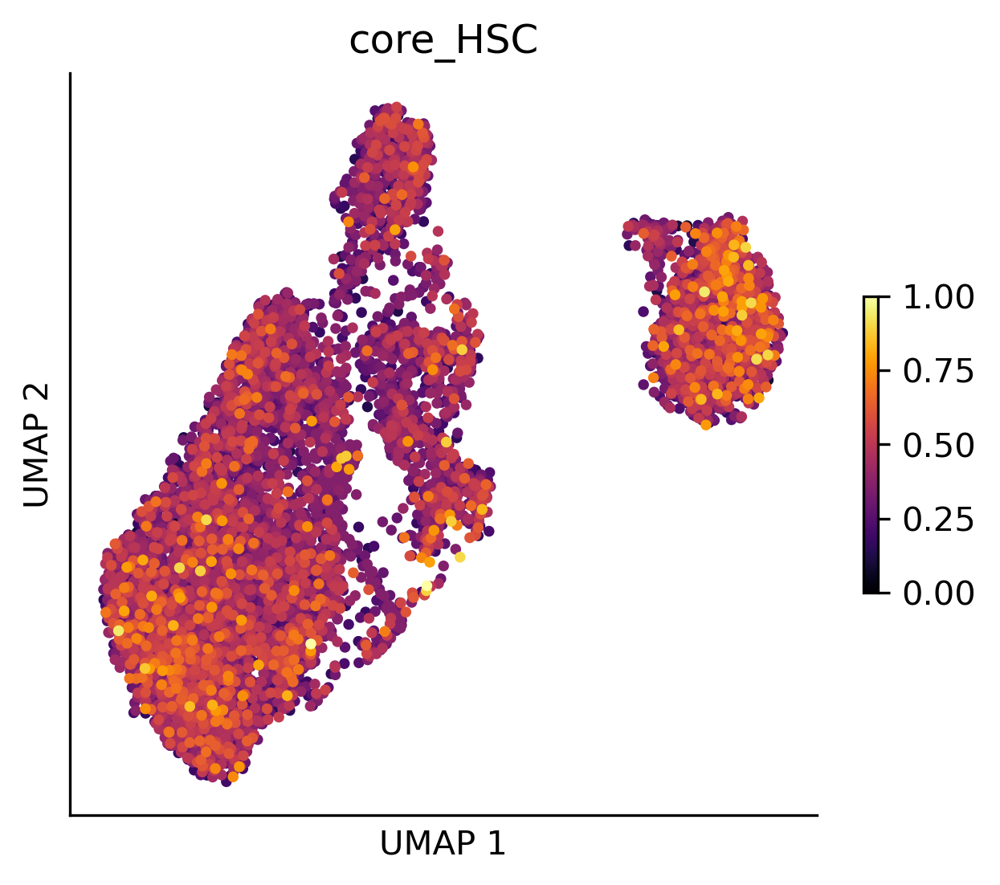

In [34]:
column_name = "core_HSC"
gene_list = [
    'CD34',
    'CD164',
    'PTPRC',
    'GATA2', 
    'GFI1B', 
    'REL', 
    'STAT5A', 
    'FOS',
]

genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values


sc.tl.score_genes(adata,
                  gene_list=genes.index, 
                  ctrl_size=len(genes.index),
                  score_name=column_name)

adata.obs[column_name] = min_max(adata.obs[column_name])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column_name)

plt.title(f"{column_name}")

calculate_gene_expression_stats(data)


,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
CD34,0.312173,0.0,0.530812,2457,28.70
PTPRC,0.247936,0.0,0.469511,2058,24.04
CD164,0.242190,0.0,0.464634,2029,23.70
GATA2,0.175568,0.0,0.404673,1502,17.54
GFI1B,0.095173,0.0,0.301088,851,9.94
FOS,0.064525,0.0,0.253096,583,6.81
REL,0.046848,0.0,0.210961,451,5.27
STAT5A,0.044702,0.0,0.211279,406,4.74


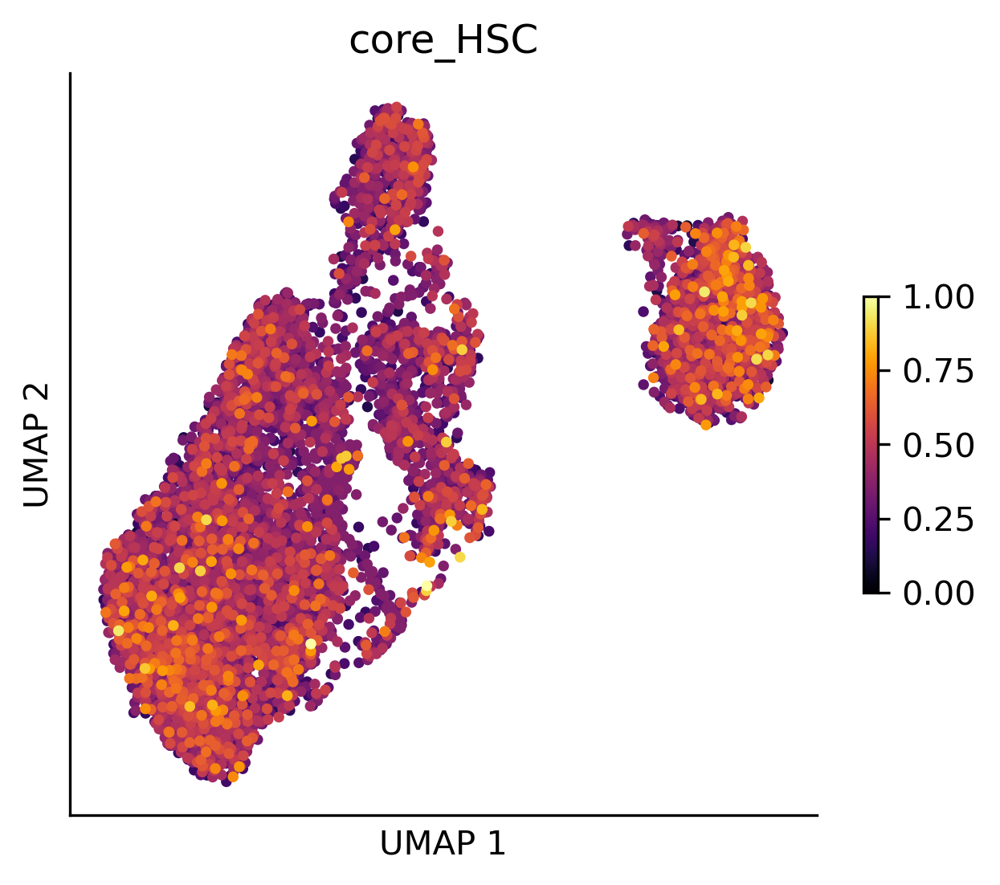

In [35]:
column_name = "core_HSC"
gene_list = [
    'CD34',
    'CD164',
    'PTPRC',
    'GATA2', 
    'GFI1B', 
    'REL', 
    'STAT5A', 
    'FOS',
]

genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values


sc.tl.score_genes(adata,
                  gene_list=genes.index, 
                  ctrl_size=len(genes.index),
                  score_name=column_name)

adata.obs[column_name] = min_max(adata.obs[column_name])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column_name)

plt.title(f"{column_name}")

calculate_gene_expression_stats(data)

,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
KLF1,1.396634,1.498830,0.802060,7112,83.06
MXI1,0.697819,0.763117,0.700454,4737,55.33
CDH1,0.462770,0.000000,0.613007,3473,40.56
FOXO3,0.327617,0.000000,0.540079,2576,30.09
EPOR,0.070134,0.000000,0.258055,652,7.62
HBB,0.005719,0.000000,0.074234,54,0.63
GATA1,0.002505,0.000000,0.050279,22,0.26
CTCF,0.002014,0.000000,0.053456,13,0.15
RXRA,0.000458,0.000000,0.019540,5,0.06


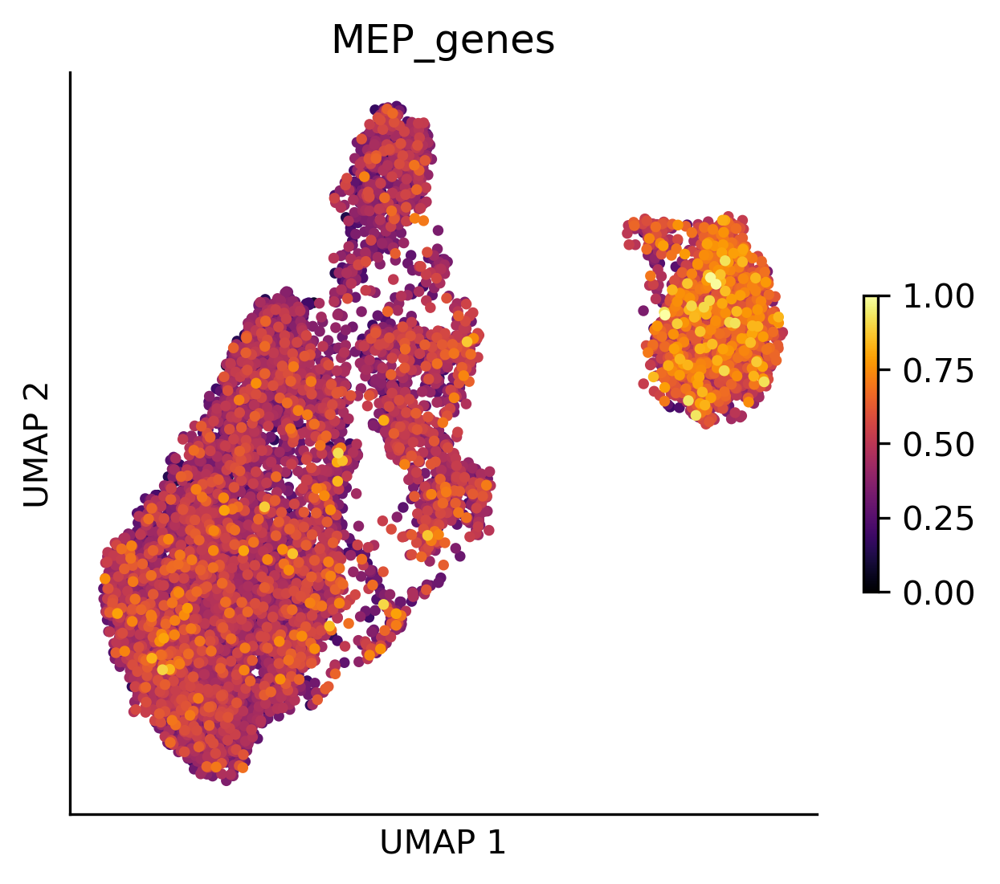

In [36]:
column_name = "MEP_genes"
gene_list = [
    'HBB','GATA1','EPOR','CDH1','KLF1','RXRA','FOXO3','MXI1','CTCF',
]

genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values


sc.tl.score_genes(adata,
                  gene_list=genes.index, 
                  ctrl_size=len(genes.index),
                  score_name=column_name)

adata.obs[column_name] = min_max(adata.obs[column_name])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column_name)

plt.title(f"{column_name}")

calculate_gene_expression_stats(data)

,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
CSF3R,0.137889,0.0,0.421623,949,11.08
MYB,0.043086,0.0,0.211963,379,4.43
FLI1,0.011315,0.0,0.106228,106,1.24
CTSB,0.004735,0.0,0.066929,45,0.53
CEBPA,0.003603,0.0,0.061151,32,0.37
RUNX1,0.000289,0.0,0.015810,3,0.04


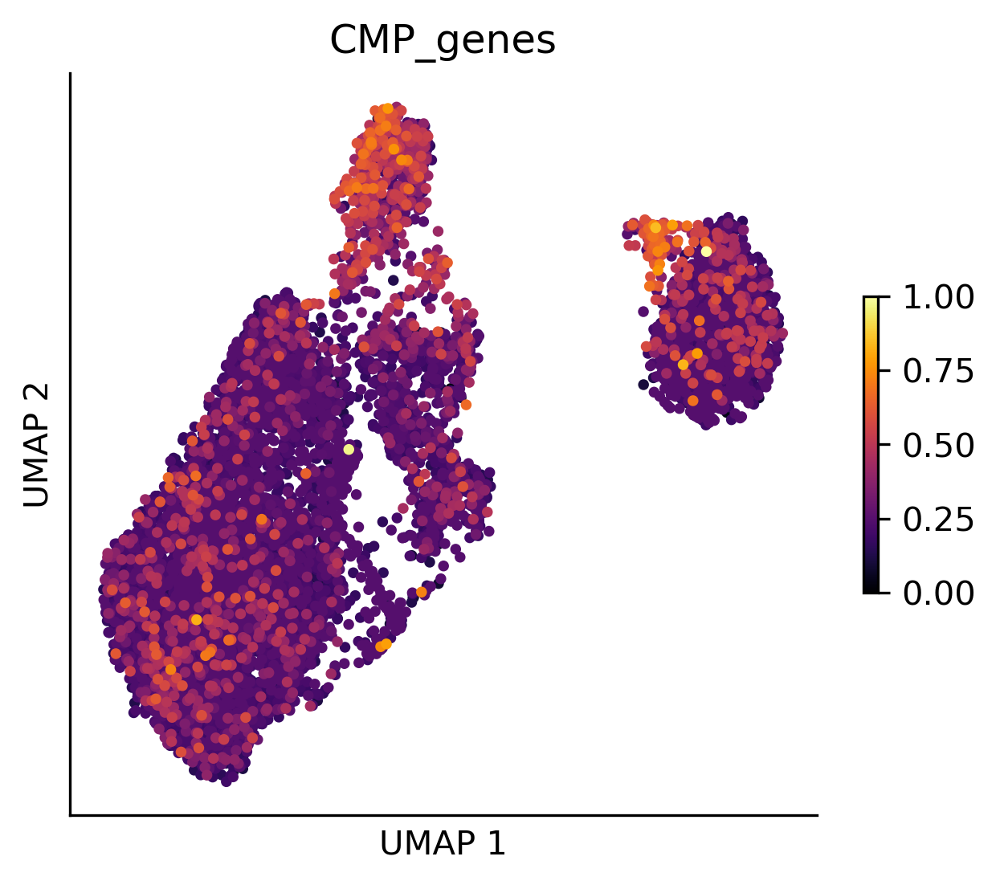

In [37]:
column_name = "CMP_genes"
gene_list = [
    'CSF3R','CTSB','CEBPA','MYB','FLI1','RUNX1','MPO'
]

genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values


sc.tl.score_genes(adata,
                  gene_list=genes.index, 
                  ctrl_size=len(genes.index),
                  score_name=column_name)

adata.obs[column_name] = min_max(adata.obs[column_name])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column_name)

plt.title(f"{column_name}")

calculate_gene_expression_stats(data)

,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
ALDH1A1,0.082716,0.0,0.281599,759,8.86
KCNK17,0.053503,0.0,0.228501,487,5.69
IL33,0.020238,0.0,0.140300,191,2.23


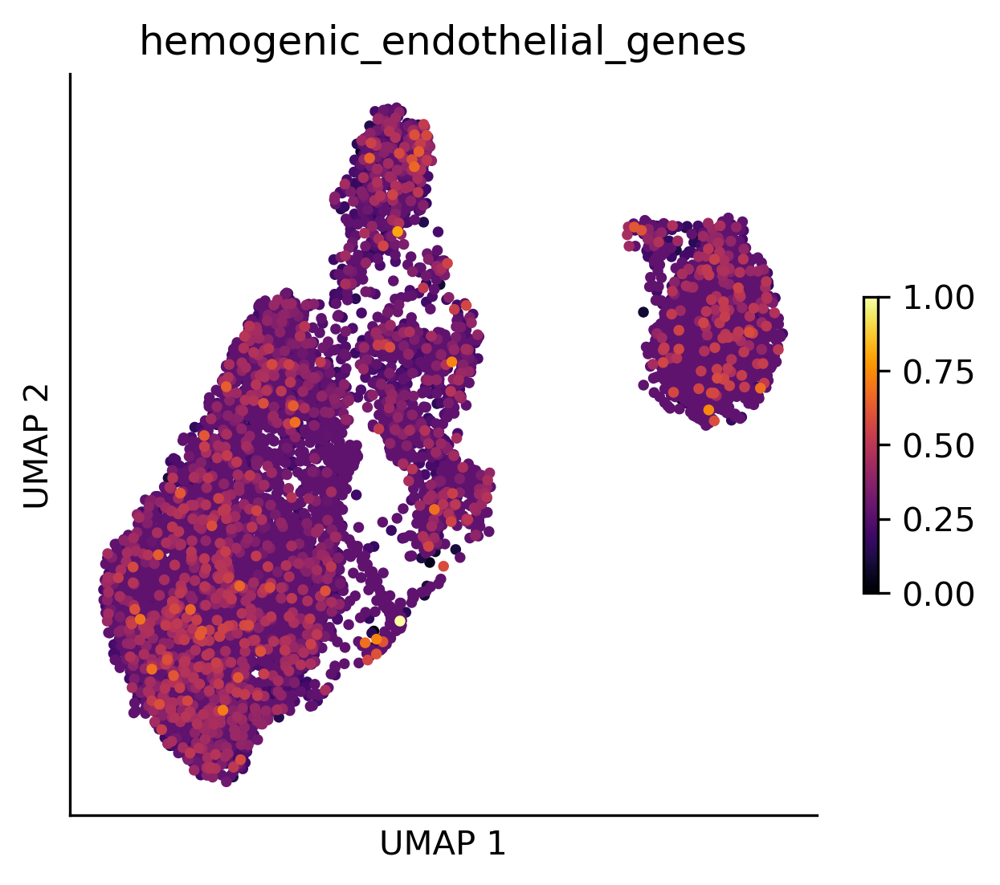

In [38]:
column_name = "hemogenic_endothelial_genes"
gene_list = [
    'ALDH1A1','KCNK17','IL33'
]

genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values


sc.tl.score_genes(adata,
                  gene_list=genes.index, 
                  ctrl_size=len(genes.index),
                  score_name=column_name)

adata.obs[column_name] = min_max(adata.obs[column_name])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column_name)

plt.title(f"{column_name}")

calculate_gene_expression_stats(data)

# load in the DEG 

In [39]:
hsc = pd.read_csv("../config/gene_annotations/HSC_vs_FB.csv")
hsc = hsc[hsc['cell_type'] != "Fibroblast"]
hsc = hsc.sort_values(by='logfoldchanges', ascending=False)
hsc = hsc[~hsc['gene_name'].str.startswith("MT")]
hsc = hsc[~hsc['gene_name'].str.startswith("RP")]

hsc = hsc[hsc['pct_nz_group'] > 0.98]

n_genes = 50

gene_list = hsc.head(n_genes)['gene_name'].values
genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values

calculate_gene_expression_stats(data)



,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
RACK1,1.063406,1.206108,0.733110,6326,73.88
NPM1,0.791480,0.917477,0.709481,5229,61.07
DEFA3,0.343080,0.000000,0.540966,2739,31.99
PABPC1,0.152203,0.000000,0.375781,1330,15.53
NCL,0.151860,0.000000,0.386075,1278,14.93
MMP7,0.111728,0.000000,0.325323,1001,11.69
COX4I1,0.097708,0.000000,0.311159,862,10.07
PTMA,0.087728,0.000000,0.291286,787,9.19
BTF3,0.070929,0.000000,0.263689,641,7.49
PTPRCAP,0.059688,0.000000,0.247275,532,6.21


In [40]:
hsc = pd.read_csv("../config/gene_annotations/HSC_vs_FB.csv")
hsc = hsc[hsc['cell_type'] == "Fibroblast"]
hsc = hsc.sort_values(by='logfoldchanges', ascending=False)
hsc = hsc[~hsc['gene_name'].str.startswith("MT")]
hsc = hsc[~hsc['gene_name'].str.startswith("RP")]

hsc = hsc[hsc['pct_nz_group'] > 0.98]

n_genes = 50

gene_list = hsc.head(n_genes)['gene_name'].values
genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values

calculate_gene_expression_stats(data)

,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
HSP90AA1,2.979787,3.052863,0.552250,8416,98.29
FTH1,1.183432,1.297734,0.761147,6636,77.51
S100A6,0.082164,0.000000,0.284750,726,8.48
DCN,0.061579,0.000000,0.248367,546,6.38
CST3,0.022254,0.000000,0.148802,207,2.42
ZBTB20,0.001306,0.000000,0.040289,11,0.13
UBA52,0.000999,0.000000,0.033538,9,0.11


# some UMAP Plots

CD34 ENSG00000174059


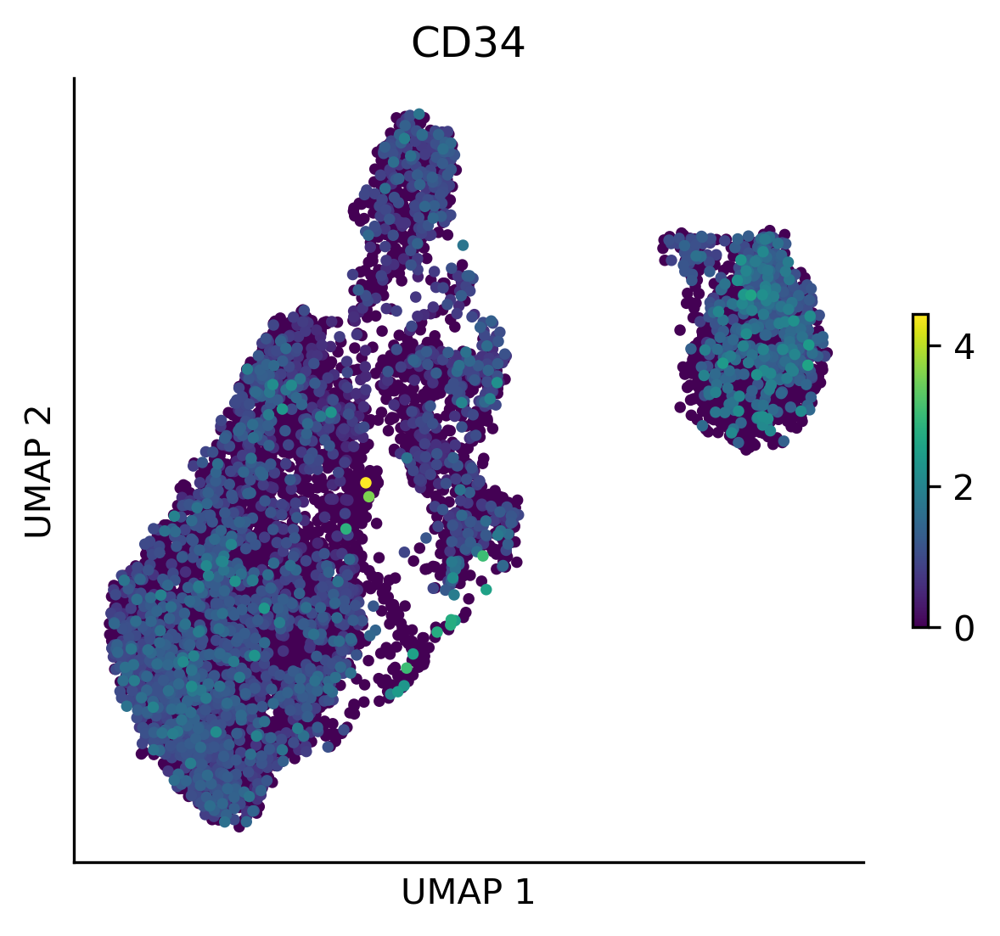

CD164 ENSG00000135535


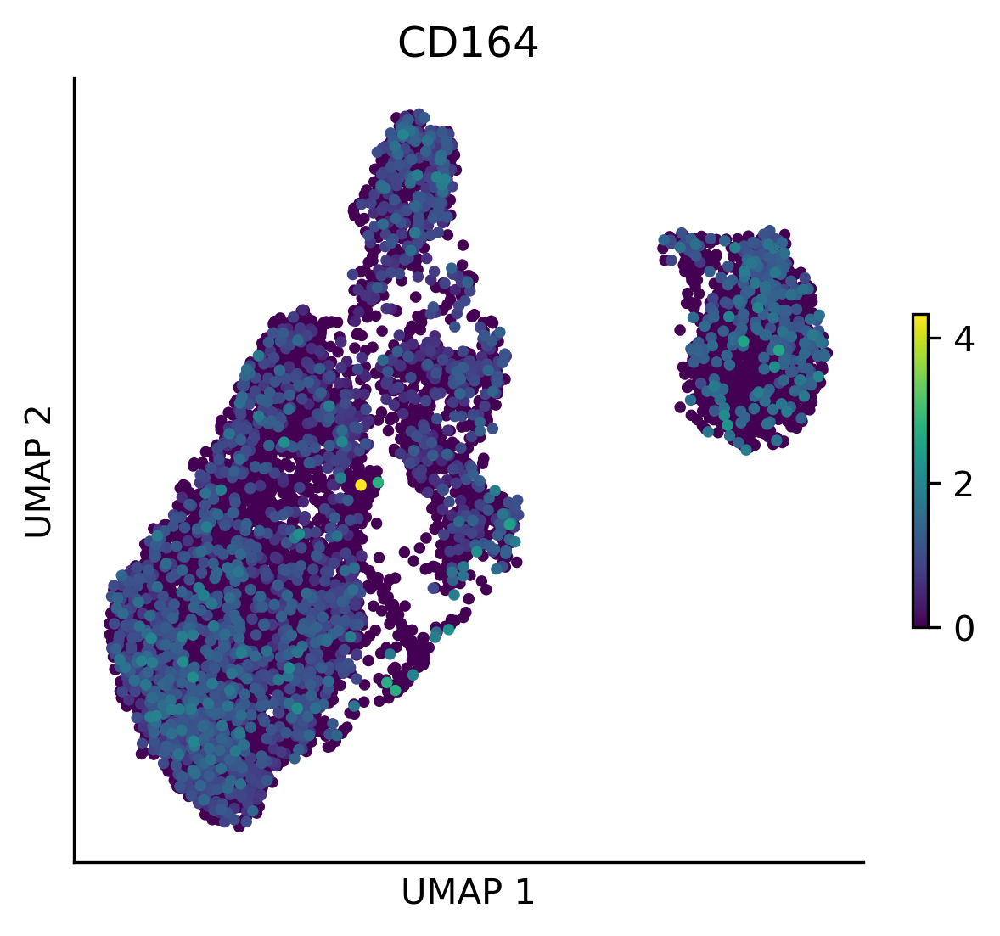

PTPRC ENSG00000081237


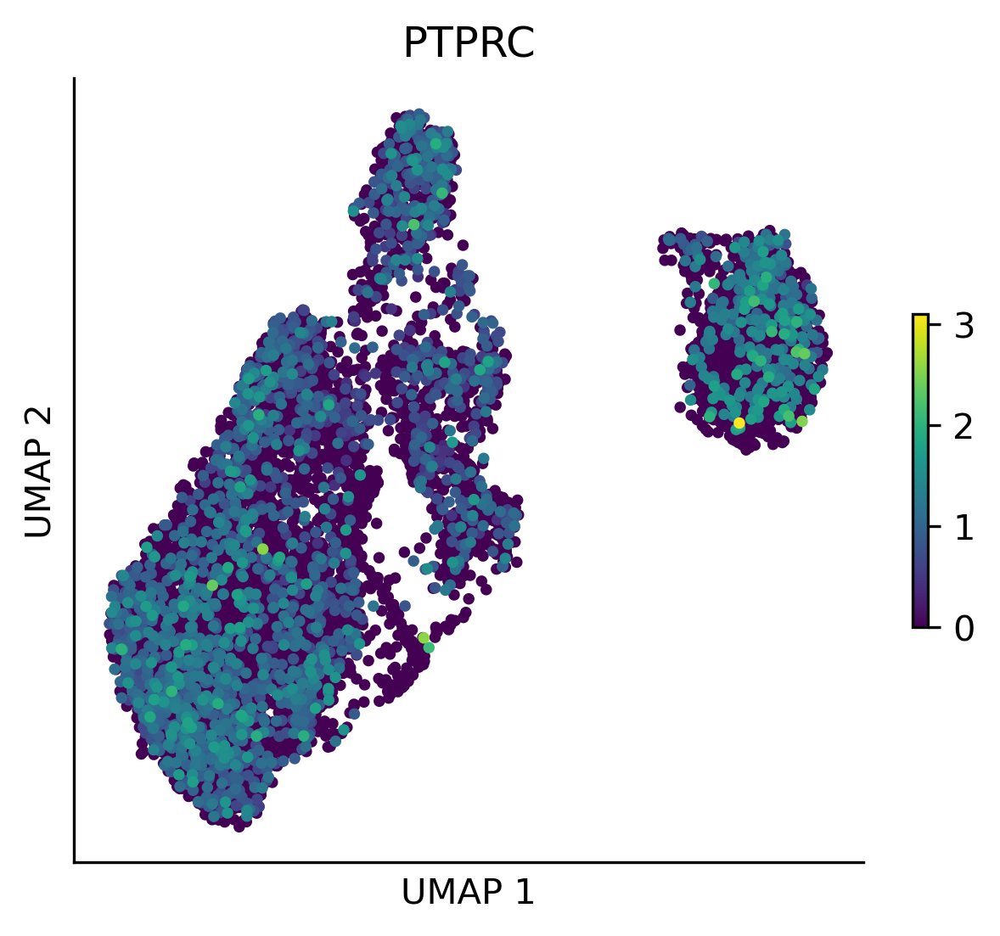

GATA2 ENSG00000179348


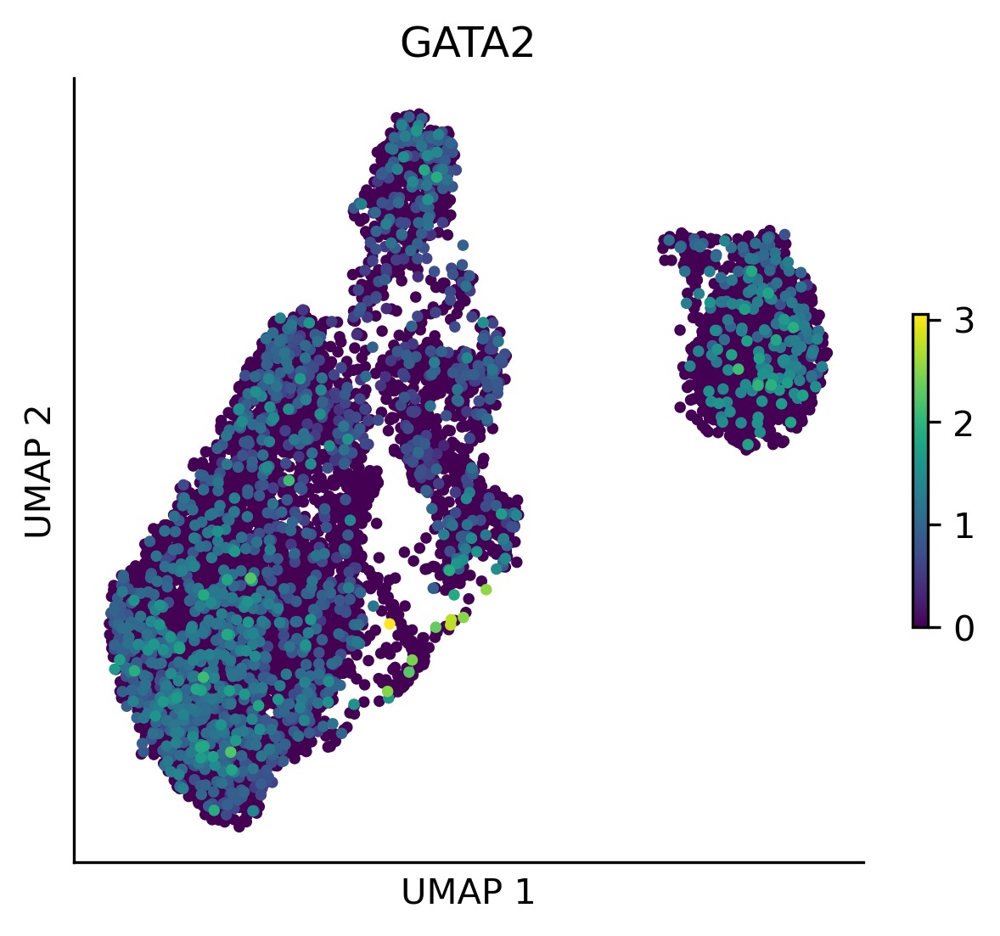

GFI1B ENSG00000165702


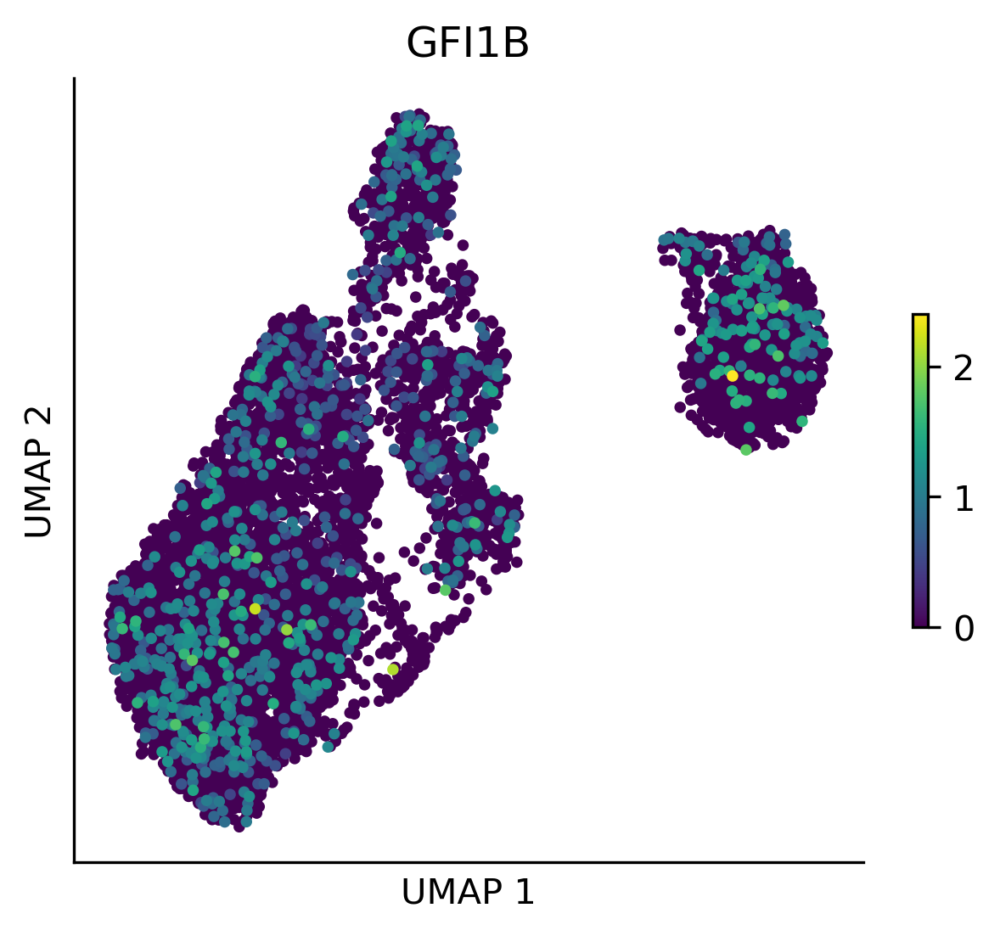

REL ENSG00000162924


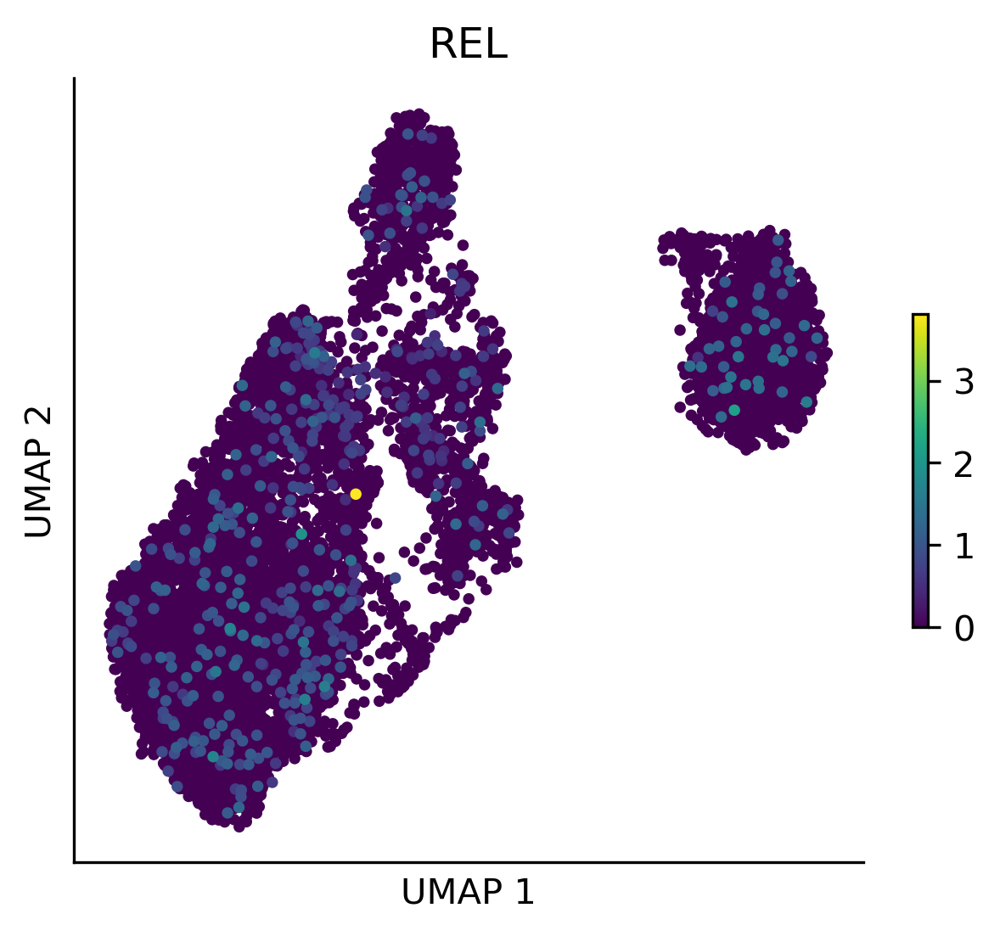

STAT5A ENSG00000126561


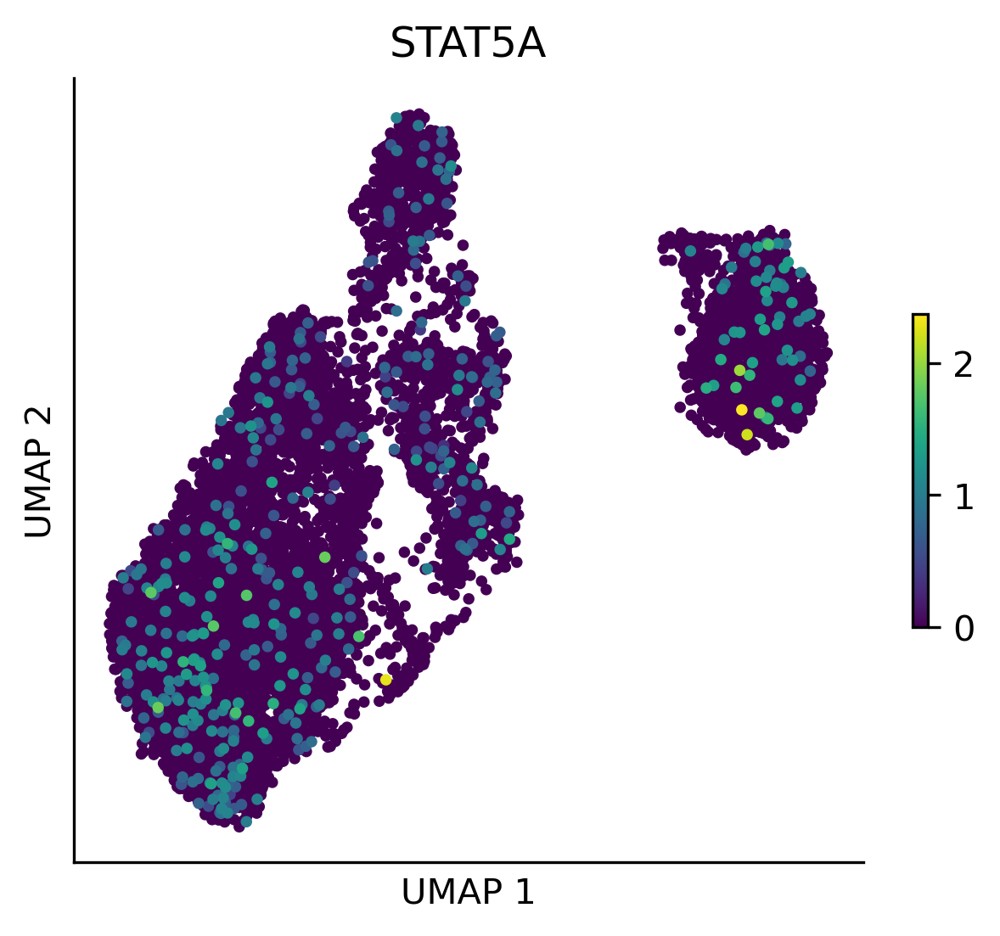

FOS ENSG00000170345


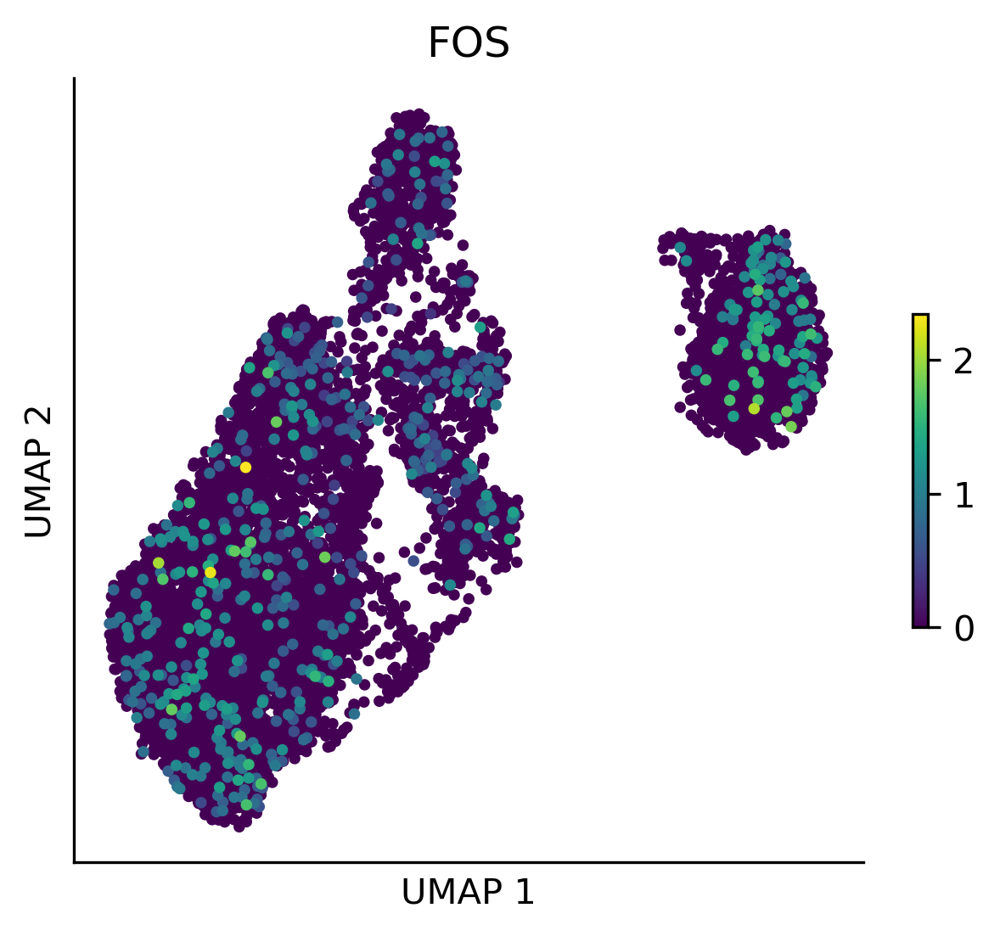

FTH1 ENSG00000167996


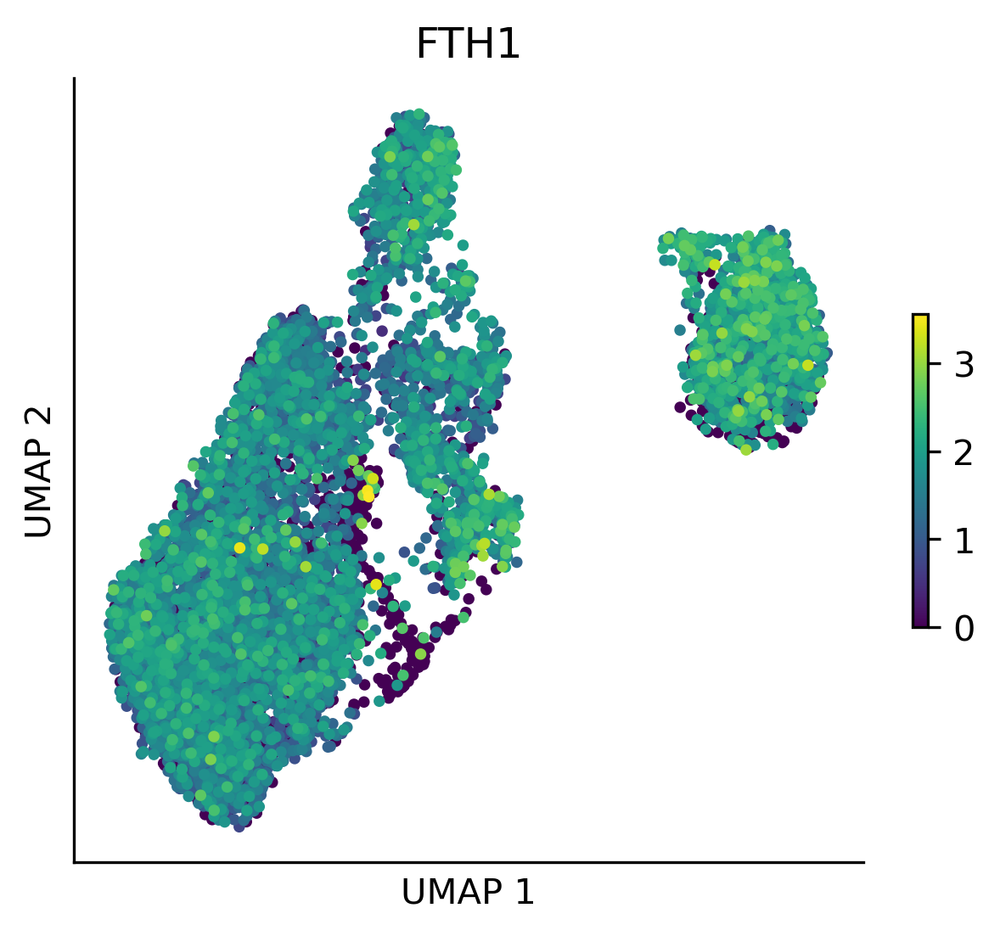

PABPC1 ENSG00000070756


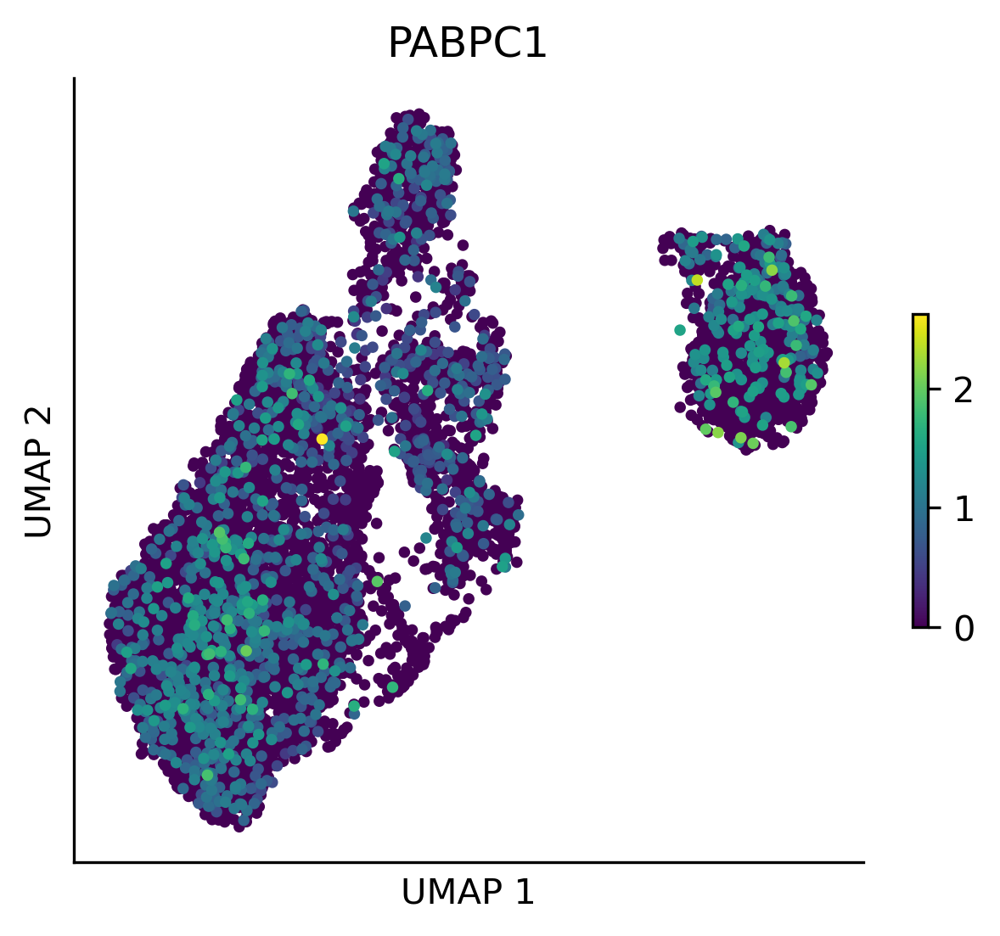

In [41]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

genes = [
    'CD34',
    'CD164',
    'PTPRC',
    'GATA2', 
    'GFI1B', 
    'REL', 
    'STAT5A', 
    'FOS',
    'FTH1',
    'PABPC1'
]


for gene_name in genes:
    gene_id = gene_map[gene_name]
    print(gene_name, gene_id)

    plot_umap_scatter(adata, 
                      s=5, 
                      cmap='viridis',
                      color=gene_id)

    plt.title(f"{gene_name}")
    plt.show()

# DGC factors
from : https://docs.google.com/spreadsheets/d/1pG4Z0eI0gBayjti-bUC37RqAFtiOi54y/edit#gid=292058813

,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
NR4A2,0.862692,0.976217,0.750109,5408,63.16
PBX1,0.429635,0.000000,0.586585,3310,38.66
RFX3,0.404251,0.000000,0.569260,3177,37.11
NFIB,0.291828,0.000000,0.735516,1479,17.27
NFIA,0.242796,0.000000,0.463294,2034,23.76
NFE2,0.202973,0.000000,0.422956,1768,20.65
GATA2,0.175568,0.000000,0.404673,1502,17.54
ETV6,0.126474,0.000000,0.361491,1053,12.30
IKZF1,0.096750,0.000000,0.304443,872,10.18
HOXB2,0.065103,0.000000,0.252092,590,6.89


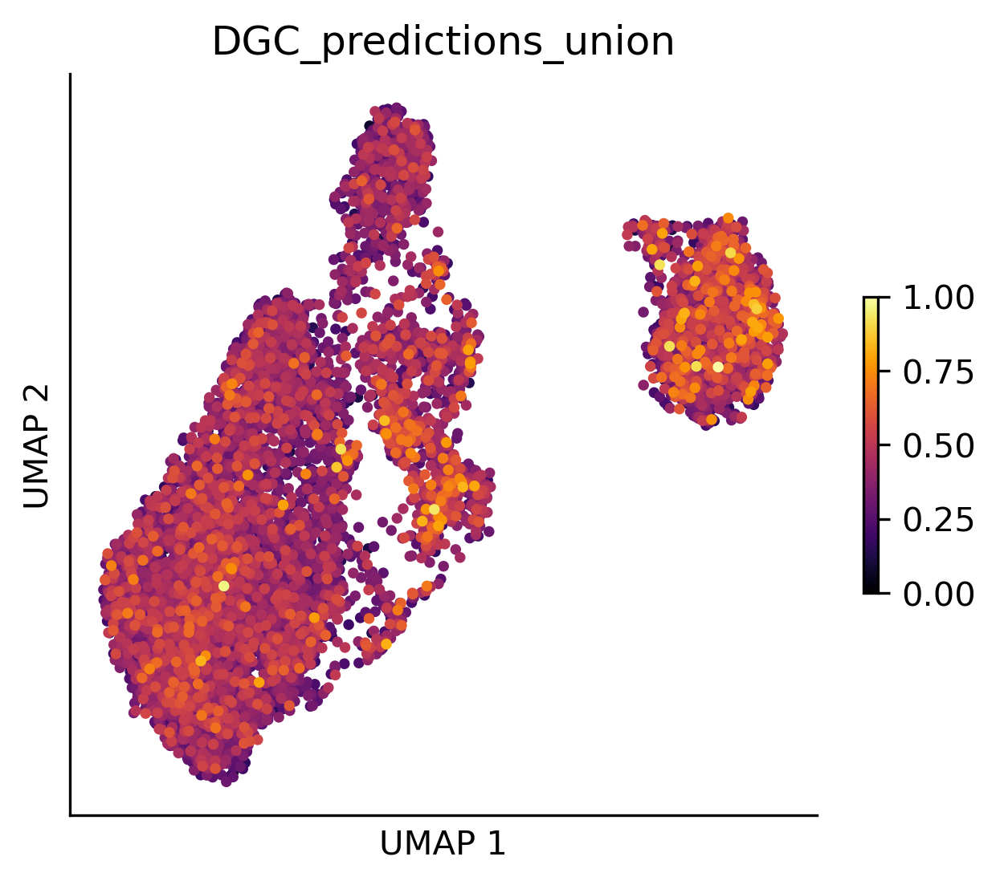

In [42]:
column_name = "DGC_predictions_union"
gene_list = [
    'STAT5A',
    'FLI1',
    'FOSB',
    'NFIA',
    'NFIB',
    'PBX1',
    'POU2F2',
    'REL',
    'ETV6',
    'GATA2',
    'HOXB2',
    'IKZF1',
    'MEF2C',
    'MYB',
    'NFE2',
    'NR4A2',
    'POU2F1',
    'RFX3',
    'RREB1',
    'RUNX3',   
]

genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values


sc.tl.score_genes(adata,
                  gene_list=genes.index, 
                  ctrl_size=len(genes.index),
                  score_name=column_name)

adata.obs[column_name] = min_max(adata.obs[column_name])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column_name)

plt.title(f"{column_name}")

calculate_gene_expression_stats(data)

,average_expression,median_expression,std_dev,num_nonzero_cells,percent_nonzero
PBX1,0.429635,0.0,0.586585,3310,38.66
SOX4,0.300260,0.0,0.509885,2448,28.59
NFIA,0.242796,0.0,0.463294,2034,23.76
NFE2,0.202973,0.0,0.422956,1768,20.65
GATA2,0.175568,0.0,0.404673,1502,17.54
STAT5A,0.044702,0.0,0.211279,406,4.74
FLI1,0.011315,0.0,0.106228,106,1.24
TAL1,0.008172,0.0,0.091429,75,0.88
POU2F1,0.001996,0.0,0.043996,19,0.22


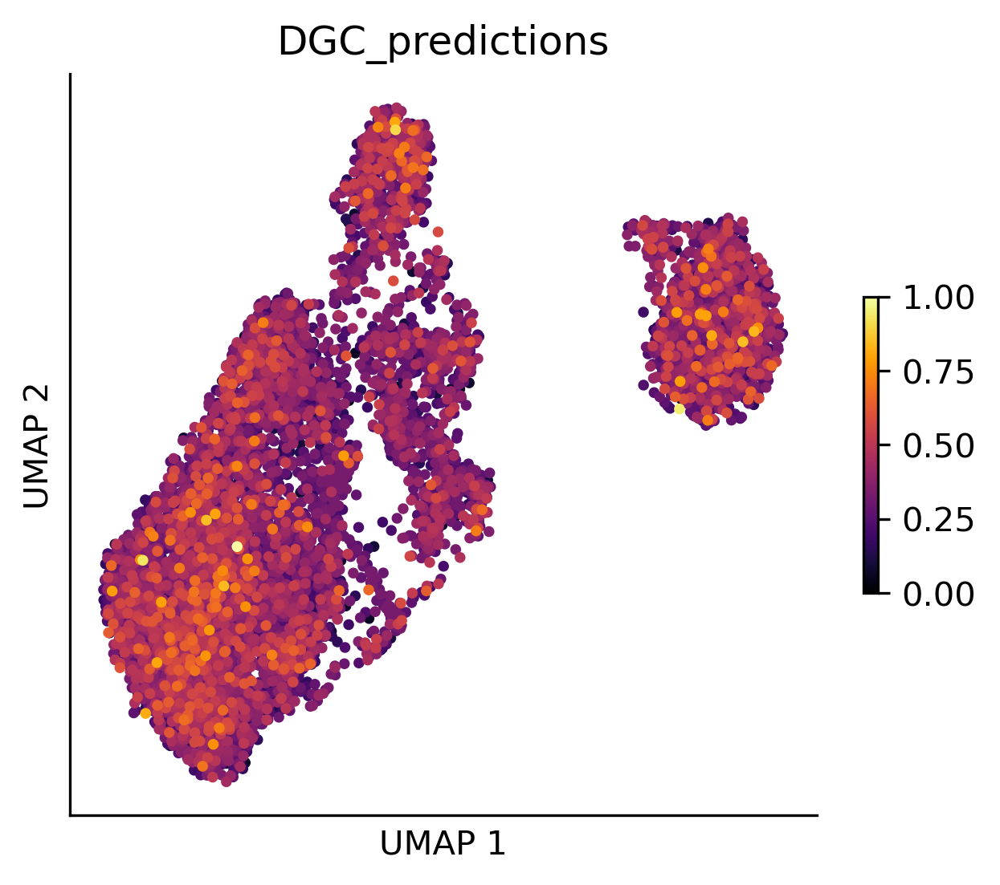

In [43]:
column_name = "DGC_predictions"
gene_list = [
    'NFE2', 
    'PBX1', 
    'TAL1', 
    'POU2F1', 
    'HOXB4', 
    'FLI1', 
    'GATA2', 
    'STAT5A', 
    'POU2F2', 
    'FOSB', 
    'NFIA', 
    'MEF2C', 
    'SOX4', 
    'HLF', 
    'IRF5', 
]

genes = adata.var[adata.var['gene_name'].isin(gene_list)]

data = adata.to_df()
data = data[genes.index]
data.columns = genes['gene_name'].values


sc.tl.score_genes(adata,
                  gene_list=genes.index, 
                  ctrl_size=len(genes.index),
                  score_name=column_name)

adata.obs[column_name] = min_max(adata.obs[column_name])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 4

plot_umap_scatter(adata, 
                  vmin=0,
                  vmax=1,
                  s=5, 
                  cmap='inferno',
                  color=column_name)

plt.title(f"{column_name}")

calculate_gene_expression_stats(data)